<a href="https://colab.research.google.com/github/DevanshA2511/Devanshs_Cardiovascular_Risk_Prediction/blob/main/Netflix_Movies_And_TV_Shows_Clustering_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Netflix Movies And TV Shows Clustering Project



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual
##### **Name**         - Devansh Saini

# **Project Summary -**

Netflix is a subscription-based streaming service known for its extensive library of movies and TV shows. With such a vast collection of content, helping users discover titles that match their preferences is a key challenge. To address this, Netflix leverages data analysis and machine learning, particularly clustering, to categorize its content into similar groups. This process involves examining various attributes of each title, such as genre, cast, and plot, and using algorithms to find common patterns and connections.

Netflix Movies and TV Shows Clustering is a data-driven approach aimed at organizing the platform's content into distinct categories using unsupervised machine learning methods. The primary goal is to enhance the user experience by offering personalized content recommendations based on individual viewing history and preferences. By classifying content into clusters, Netflix can suggest titles that are more likely to align with users' interests. This, in turn, leads to increased user engagement and satisfaction, potentially resulting in higher customer retention and revenue.

Clustering involves analyzing different data points, including genre, cast, director, and more, to identify patterns and similarities. Algorithms like k-means, hierarchical clustering, and principal component analysis (PCA) are utilized to group movies and TV shows with similar features into separate categories. Hierarchical clustering creates a hierarchical structure that categorizes content based on shared characteristics.

Clustering is a valuable tool that enables Netflix to analyze and categorize its extensive content library into coherent groups, ultimately providing users with tailored recommendations and an improved overall experience. This data-driven approach, employing algorithms like k-means, hierarchical clustering, and recommender systems, enables Netflix to uncover patterns and commonalities among titles. These insights empower Netflix to make informed decisions regarding content production and licensing.

One of the significant advantages of clustering for Netflix is its ability to deliver personalized recommendations based on user data and preferences. By recognizing patterns and similarities among titles, Netflix can suggest content that aligns with users' interests, boosting engagement and satisfaction. This, in turn, can lead to higher user retention and increased revenue.

Additionally, clustering aids Netflix in data-informed content decisions. By understanding user behavior trends, Netflix can make strategic choices about content production, acquisition, and removal from its platform. This approach optimizes the content library, ensuring a selection of titles that resonate with its user base.

In summary, Netflix Movies and TV Shows Clustering is a powerful strategy for categorizing its extensive content library, offering personalized recommendations, and enhancing the user experience. This approach is data-centric, harnessing the capabilities of unsupervised machine learning algorithms like k-means, hierarchical clustering, and recommender systems. Clustering supports Netflix in making informed decisions about content, ultimately driving user retention and revenue growth.

# **GitHub Link -**

https://github.com/DevanshA2511/Netflix-Movies-And-TV-Shows-Clustering-Project

# **Problem Statement**


This project's primary objective is to employ unsupervised learning methods for the purpose of categorizing Netflix movies and TV shows that share similarities. By examining a dataset containing information about Netflix titles, including attributes like genre, release year, cast, and plot summary, the ultimate goal is to organize these titles into clusters utilizing algorithms such as K-Means or Hierarchical clustering.

The overarching aim is to create a clustering model that effectively groups Netflix titles based on their distinctive features. This model has the potential to enhance the content recommendation system and elevate the content discovery experience for Netflix users.

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [122]:
# Import Libraries

## Data Maipulation Libraries
import numpy as np
import pandas as pd
import datetime as dt

## Data Visualisation Libraray
import matplotlib.pyplot as plt
import missingno as msno
import matplotlib.cm as cm
from wordcloud import WordCloud, STOPWORDS
import seaborn as sns
%matplotlib inline

# libraries used to process textual data
import string
string.punctuation
import nltk
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.tokenize import TweetTokenizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# libraries used to implement clusters
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import silhouette_samples
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage

# Library of warnings would assist in ignoring warnings issued
import warnings;warnings.filterwarnings('ignore')
import warnings;warnings.simplefilter('ignore')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


### Dataset Loading

In [123]:
# Load Dataset
# import drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [124]:
# Load Dataset
df = pd.read_csv('/content/drive/MyDrive/data /NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [125]:
# Dataset First Look
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [126]:
df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


### Dataset Rows & Columns count

In [127]:
# Dataset Rows & Columns count

row_count = df.shape[0]  # Returns number of rows
print(f"No. of Rows : {row_count}")
col_count = df.shape[1]  # Returns number of columns
print(f'No. of Columns : {col_count}')

No. of Rows : 7787
No. of Columns : 12


### Dataset Information

In [128]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [129]:
# Dataset Duplicate Value Count
duplicates = sum(df.duplicated())
print(f'No. of duplicate values in dataset are {duplicates}')

No. of duplicate values in dataset are 0


#### Missing Values/Null Values

In [130]:
# Missing Values/Null Values Count
total_null = df.isna().sum().sum()
print(f'Total Null values present are : {total_null}')
df.isna().sum().sort_values(ascending = False)[:6].reset_index().rename(columns={'index':'Columns',0:'Null values'})

Total Null values present are : 3631


,Columns,Null values
0,director,2389
1,cast,718
2,country,507
3,date_added,10
4,rating,7
5,show_id,0


<Axes: >

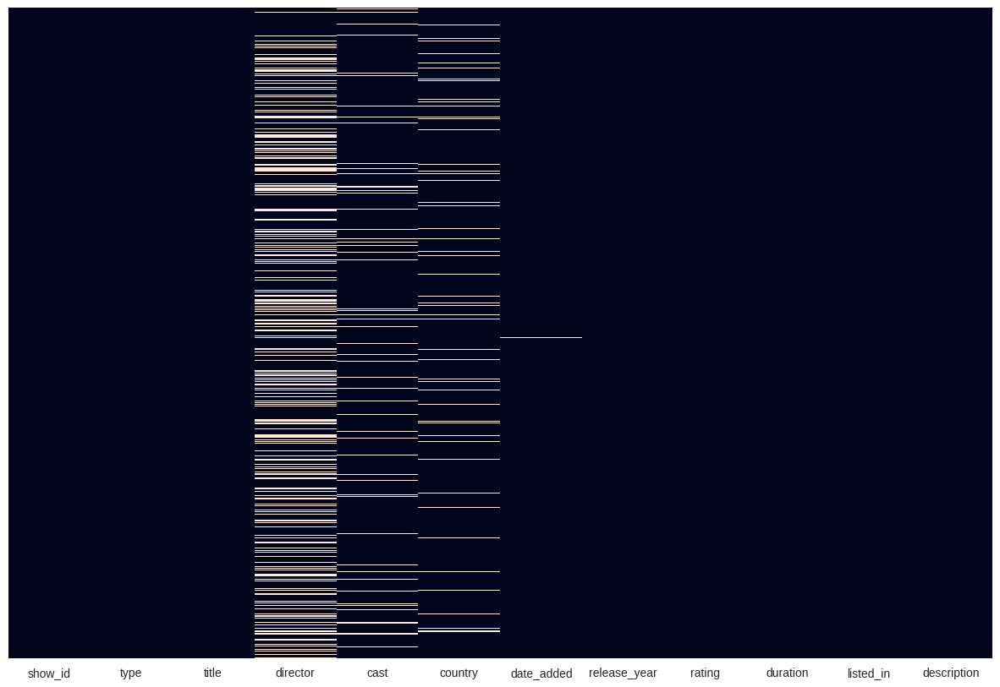

In [131]:
# Visualizing the missing values
plt.figure(figsize=(15, 10))
sns.heatmap(df.isnull(),cbar = False, yticklabels = False)

### What did you know about your dataset?

*From the above heatmap and data analysis i can say that:*
1. There are 7787 rows and 12 coloumns in the dataset.

2. A total of 0 ***duplicate*** values are present in the dataset.

3. A total of 3631 ***Null*** values are present in the dataset

## ***2. Understanding Your Variables***

In [132]:
# Dataset Columns
print(list(df.columns))

['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 'release_year', 'rating', 'duration', 'listed_in', 'description']


In [133]:
# Dataset Describe
df.describe(include='all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


### Variables Description

**show_id** : Unique ID for every Movie / Tv Show

**type** : Identifier - A Movie or TV Show

**title** : Title of the Movie / Tv Show

**director** : Director of the Movie

**cast** : Actors involved in the movie / show

**country** : Country where the movie / show was produced

**date_added** : Date it was added on Netflix

**release_year** : Actual Releaseyear of the movie / show

**rating** : TV Rating of the movie / show

**duration** : Total Duration - in minutes or number of seasons

**listed_in** : Genere

**description** : The Summary description

### Check Unique Values for each variable.

In [134]:
# Check Unique Values for each variable.
df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

## 3. ***Data Wrangling***

### Data Wrangling Code

In [135]:
# Write your code to make your dataset analysis ready.

In [136]:
print('Percentage Of Missing Data')
print(round(df.isna().sum()[df.isna().sum() > 0].sort_values(ascending=False)/len(df)*100,2))

Percentage Of Missing Data
director      30.68
cast           9.22
country        6.51
date_added     0.13
rating         0.09
dtype: float64


* The missing values in the 'director', 'cast', and 'country' columns can be replaced with the label 'Unknown'.

In [137]:
df[['director']] = df[['director']].fillna('Unknown')
df[['cast']]     = df[['cast']].fillna('Unknown')
df[['country'] ] = df[['country']].fillna('Unknown')

* Given that we cannot impute missing values in the 'date_added' column, and these missing entries represent a small and relatively insignificant portion of the dataset, we will opt to omit these values from our analysis.

In [138]:
df.dropna(subset=['date_added'], inplace=True)

* To address the absence of values in the 'rating' column, we can utilize the mode as a means of imputation, as this attribute is categorical in nature.

In [139]:
df['rating'].fillna(value=df['rating'].mode()[0],inplace=True)

In [140]:
# Define a mapping dictionary to convert current ratings to new ratings
rating_dict = {
    'TV-MA': 'Adults',
    'R': 'Adults',
    'PG-13': 'Teens',
    'TV-14': 'Young Adults',
    'TV-PG': 'Older Kids',
    'NR': 'Adults',
    'TV-G': 'Kids',
    'TV-Y': 'Kids',
    'TV-Y7': 'Older Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'NC-17': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'UR': 'Adults'
}

# Replace the current ratings with the new ratings using the mapping dictionary
df['rating'].replace(rating_dict, inplace=True)

# Print the unique values in the 'rating' column to verify the changes
unique_ratings = df['rating'].unique()
print("Unique ratings after mapping:")
print(unique_ratings)


Unique ratings after mapping:
['Adults' 'Teens' 'Young Adults' 'Older Kids' 'Kids']


* Modifying the 'duration' column in the dataframe by dividing the string values using a space delimiter and subsequently converting them into integers.

In [141]:
df['duration'] = df['duration'].apply(lambda x: int(x.split()[0]))
# datatype of duration
df.duration.dtype

dtype('int64')

* Choosing the primary country and primary genre for each entry in the dataframe, to simplifiy the data for subsequent analysis.

In [142]:
df['country'] = df['country'].apply(lambda x: x.split(',')[0])
df['listed_in'] = df['listed_in'].apply(lambda x: x.split(',')[0])

In [143]:
df["date_added"] = pd.to_datetime(df['date_added'])
df['year_added'] = df['date_added'].dt.year
df['month_added'] = df['date_added'].dt.month

### What all manipulations have you done and insights you found?

1. Used 'unknown' to fill missing values in director , cast and country.

2. Filling missing null values in 'rating' with mode.

3. Made new ratings to simply data analysis

4. Modifying the 'duration' column in the dataframe by dividing the string values using a space delimiter and subsequently converting them into integers.

5. Choosing the primary country and primary genre for each entry in the dataframe, to simplifiy the data for subsequent analysis.

6. Converting timestamp into datetime format and making new columns month_added and year_added.

In [144]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7777 entries, 0 to 7786
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7777 non-null   object        
 1   type          7777 non-null   object        
 2   title         7777 non-null   object        
 3   director      7777 non-null   object        
 4   cast          7777 non-null   object        
 5   country       7777 non-null   object        
 6   date_added    7777 non-null   datetime64[ns]
 7   release_year  7777 non-null   int64         
 8   rating        7777 non-null   object        
 9   duration      7777 non-null   int64         
 10  listed_in     7777 non-null   object        
 11  description   7777 non-null   object        
 12  year_added    7777 non-null   int64         
 13  month_added   7777 non-null   int64         
dtypes: datetime64[ns](1), int64(4), object(9)
memory usage: 911.4+ KB


## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

### **Univariate Analysis**

#### Chart - 1: Which country has the most titles?

Text(0, 0.5, 'Country')

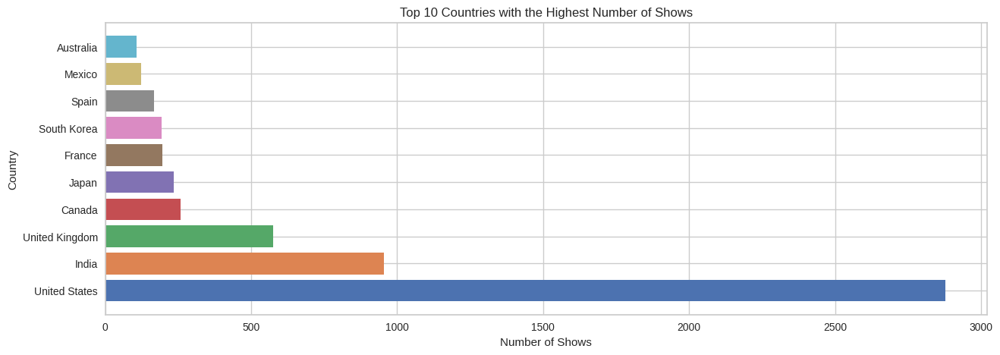

In [145]:
# Chart - 1 visualization code
# Get the top 10 countries with the highest number of movies and TV shows in the dataset
top_countries = df.loc[df['country'] != 'Unknown', 'country'].value_counts().nlargest(10)
plt.figure(figsize=(15,5))
colors = sns.color_palette('deep', n_colors=10)
plt.barh(top_countries.index, top_countries.values, color=colors) # Plot a horizontal bar chart
plt.title('Top 10 Countries with the Highest Number of Shows')
plt.xlabel('Number of Shows')
plt.ylabel('Country')

In [146]:
# Calculate the percentage share of shows by the top 3 and top 10 countries
top_3_share = top_countries.nlargest(3).sum() / len(df) * 100
top_10_share = top_countries.sum() / len(df) * 100

# Print the percentage shares
print(f"The top 3 countries account for {top_3_share:.2f}% of shows in the dataset.")
print(f"The top 10 countries account for {top_10_share:.2f}% of shows in the dataset.")

The top 3 countries account for 56.69% of shows in the dataset.
The top 10 countries account for 73.19% of shows in the dataset.


##### 1. Why did you pick the specific chart?

I selected this chart because it displays the top 10 countries with the most extensive collection of movies and TV shows in the dataset, which holds significant relevance for any company considering entry into or expansion within the global streaming industry.

##### 2. What is/are the insight(s) found from the chart?

The chart illustrates that the United States stands out as the most prolific producer of movies and TV shows within the dataset, boasting a total of over 2,500 titles. Following closely are India, the United Kingdom, and Canada, each contributing roughly between 500 and 1,000 titles. Other notable countries within the top 10 include France, Japan, and Spain. It's noteworthy that the top three countries, namely the USA, India, and the UK, collectively represent 56.69% of the shows in the dataset, while the top 10 countries collectively contribute to 73.19% of the total shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The chart clearly illustrates that the United States stands out as the most prominent producer of both movies and TV shows in the dataset, with an impressive tally of over 2,500 titles. Following closely behind are India, the United Kingdom, and Canada, each making substantial contributions ranging from approximately 500 to 1,000 titles. Additionally, noteworthy mentions within the top 10 list encompass countries like France, Japan, and Spain. It's worth highlighting that the top three countries, specifically the USA, India, and the UK, jointly account for 56.69% of the shows in the dataset, while the cumulative contribution of the top 10 countries reaches 73.19% of the total shows.

#### Chart - 2: Which year had the most titles released?

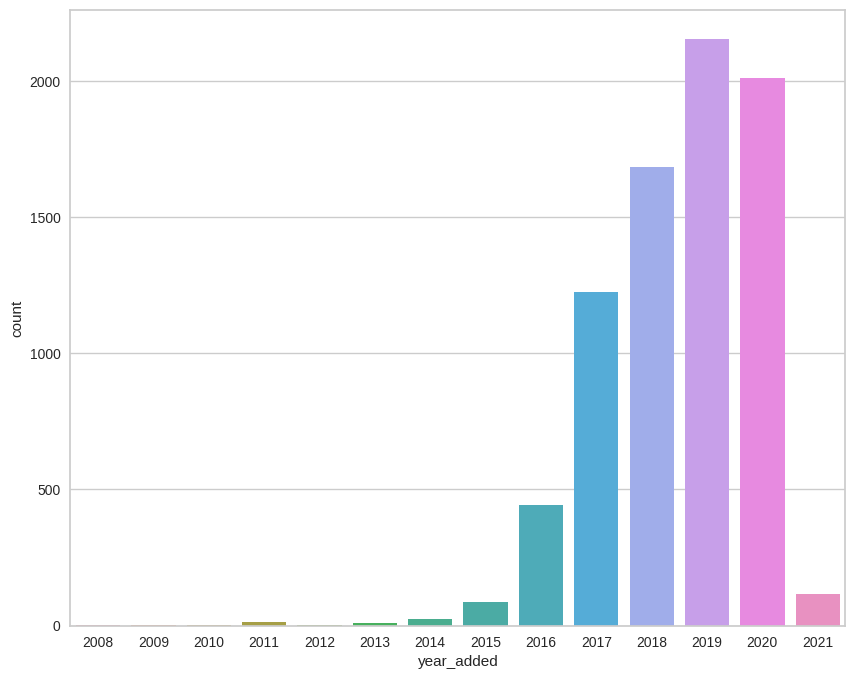

In [147]:
# Chart - 2 visualization code
# Plotting the Countplot

plt.figure(figsize=(10, 8))

# Use sns.countplot to create the countplot
ax = sns.countplot(data=df, x='year_added')

# Show the plot
plt.show()

##### 1. Why did you pick the specific chart?

This visual representation is a count plot that depicts the yearly additions of both TV shows and movies to Netflix, based on the dataset. The code employs the seaborn library to generate this graphical representation.

##### 2. What is/are the insight(s) found from the chart?

2018, 2019 and 2020 had the most number of released titles with most in 2019.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above insight shows the rapid growth of titles over the past three years which shows postive growth.

#### Chart - 3: What rating category has the highest number of titles?

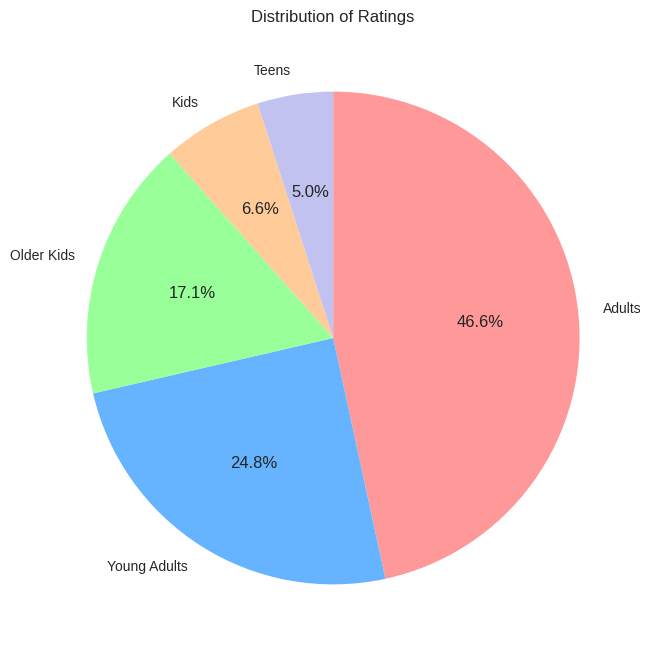

In [148]:
# Chart - 3 visualization code
# Getting the value counts for the 'rating' column
df_rating = df['rating'].value_counts()
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#ffb366']

# Creating a pie chart with the lighter colors
plt.figure(figsize=(8, 8))
plt.pie(df_rating.values, labels=df_rating.index, autopct='%1.1f%%', startangle=90, counterclock=False, colors=colors)

# Adding a title to the chart
plt.title('Distribution of Ratings')

# Displaying the pie chart
plt.show()

##### 1. Why did you pick the specific chart?

Pie charts are effective for showing the proportion of data within different categories, which is exactly what this chart aims to show.

##### 2. What is/are the insight(s) found from the chart?

This chart provides insights into the Netflix dataset, revealing that the most prevalent rating category is 'Adults' (TV-MA - Mature Audiences), comprising nearly 47% of all titles. Following closely are 'Young Adults' (TV-14 - Parents Strongly Cautioned) and 'Older Kids' (TV-PG - Parental Guidance Suggested), accounting for approximately 25% and 17% of the titles, respectively.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These findings have the potential to generate a favorable business influence by guiding decisions regarding content procurement and production. For instance, the prevalence of TV-MA ratings indicates a robust demand for mature content on the platform, offering valuable insights for content acquisition and creation strategies.

#### Chart - 4: Which genre has the most titles?

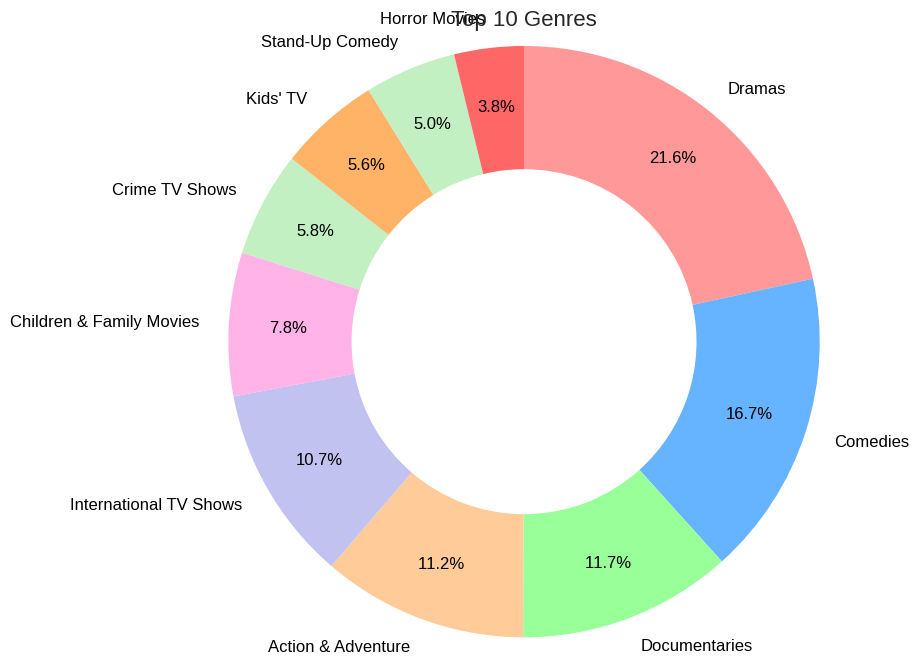

In [149]:
# Chart - 4 visualization code

# Getting the top 10 genres by their counts
top_genres = df["listed_in"].value_counts().head(10)
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#ffb366', '#c2f0c2', '#ff6666']

# Creating a pie chart with specified attributes
plt.figure(figsize=(8, 8))
plt.pie(top_genres, labels=top_genres.index, autopct='%1.1f%%', pctdistance=0.8, labeldistance=1.1,
        radius=1.2, wedgeprops=dict(width=0.5), startangle=90,
        textprops=dict(color="black", fontsize=12), counterclock=False, colors=colors)

# Adding a title to the chart
plt.title('Top 10 Genres', fontsize=16)

# Displaying the pie chart
plt.show()


##### 1. Why did you pick the specific chart?

I selected the pie chart as it offers an effective means of visually representing the distribution of categorical data. In this instance, we are utilizing it to depict the distribution of the top 10 genres within the Netflix dataset.

##### 2. What is/are the insight(s) found from the chart?

The pie chart provides a visual breakdown of the percentage distribution for each of the top 10 genres in the dataset. From this chart, we discern that the most prevalent genre is dramas, closely trailed by comedies and documentaries. Additionally, it's evident that these top 10 genres collectively constitute a substantial portion of the dataset.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights derived from this chart have the potential to foster a positive impact on Netflix's business strategy by offering a deeper understanding of their audience's content preferences. Armed with this knowledge, Netflix can make more informed choices regarding content acquisition and production, ultimately boosting viewership and revenue.

#### Chart - 5: Which type of titles are more prevelant?

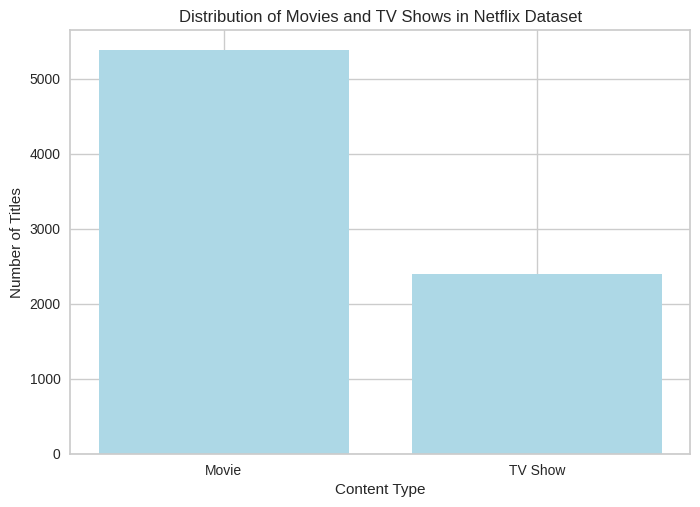

In [150]:
# Chart - 5 visualization code

# Counting the occurrences of each unique value in the 'type' column
type_counts = df['type'].value_counts()

# Creating a bar chart of the type counts with light blue color
plt.bar(type_counts.index, type_counts.values, color='lightblue')

# Adding labels and a title to the chart
plt.xlabel('Content Type')
plt.ylabel('Number of Titles')
plt.title('Distribution of Movies and TV Shows in Netflix Dataset')

# Displaying the bar chart
plt.show()

##### 1. Why did you pick the specific chart?

A bar chart serves as a widely used and suitable option for presenting the distribution of categorical data, as exemplified by the count of movies and TV shows in the Netflix dataset. It facilitates straightforward comparisons between different categories and offers a visually intuitive representation of the content type distribution within the dataset. Consequently, for this particular dataset and research inquiry, a bar chart is a fitting and effective choice.

##### 2. What is/are the insight(s) found from the chart?

* The Netflix dataset predominantly consists of movies, with a notably higher count compared to TV shows.

* This distribution disparity between movies and TV shows in the dataset implies a preference for movies within Netflix's content catalog.

* Nonetheless, the dataset still contains a substantial number of TV shows, highlighting Netflix's substantial investment in both producing and procuring TV show content for its platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights extracted from this chart could potentially yield a favorable business impact for Netflix. The awareness that a majority of the content in the Netflix dataset comprises movies and that Netflix exhibits a preference for this content type could influence strategic decisions related to content production and acquisition. For example, Netflix might opt to allocate greater resources toward creating and acquiring movies to enhance its appeal to viewers and subscribers.

#### Chart - 6: Which cast members enjoy the highest level of popularity?

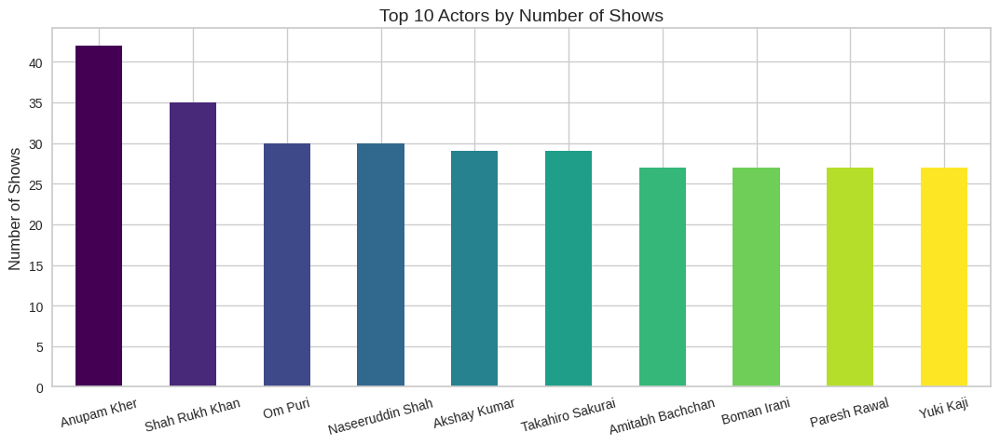

In [151]:
# Chart - 6 visualization code
import matplotlib.pyplot as plt
import numpy as np

# Filtering out rows where the cast is not 'Unknown'
filtered_df = df[~(df['cast'] == 'Unknown')]

# Splitting the remaining cast into separate values
split_cast = filtered_df['cast'].str.split(', ', expand=True)

# Stacking the cast values and count the top 10 actors by the number of shows
cast_values = split_cast.stack()
top_10_actors = cast_values.value_counts().nlargest(10)

# Define a color palette for the bars
colors = plt.cm.viridis(np.linspace(0, 1, len(top_10_actors)))

# Creating a bar chart with different colors for each bar
top_10_actors.plot(kind='bar', figsize=(13, 5), color=colors)

# Setting chart title and labels
plt.title('Top 10 Actors by Number of Shows', fontsize=14)
plt.ylabel('Number of Shows', fontsize=12)
plt.xticks(rotation=15)

# Displaying the bar chart
plt.show()

##### 1. Why did you pick the specific chart?

A bar chart showcasing the top 10 actors based on their Netflix show appearances. This chart is ideal for examining the actor-show relationship and offers valuable insights into the platform's most popular actors.

##### 2. What is/are the insight(s) found from the chart?

The chart offers valuable insights into Netflix's most popular actors:

*  Anupam Kher leads with 42 show appearances, making him the top actor by count.

*  Shah Rukh Khan follows closely with 35 show appearances, securing the second position.

*  Notably, most of the top 10 actors have featured in a range of 25 to 30 shows on Netflix.

*  The majority of these top 10 actors hail from India, except for Takahiro Sakurai and Yuki Kaji, who represent Japan.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* Recognizing the platform's top actors allows Netflix to source or create content featuring these actors, potentially boosting viewership and engagement.

*  These insights aid in pinpointing target demographics for various titles, as distinct actors may cater to diverse audience segments.

*  The data additionally assists Netflix in discerning user preferences and trends, informing decisions regarding content acquisition and production.

#### Chart - 7: Which director boasts the highest number of titles?

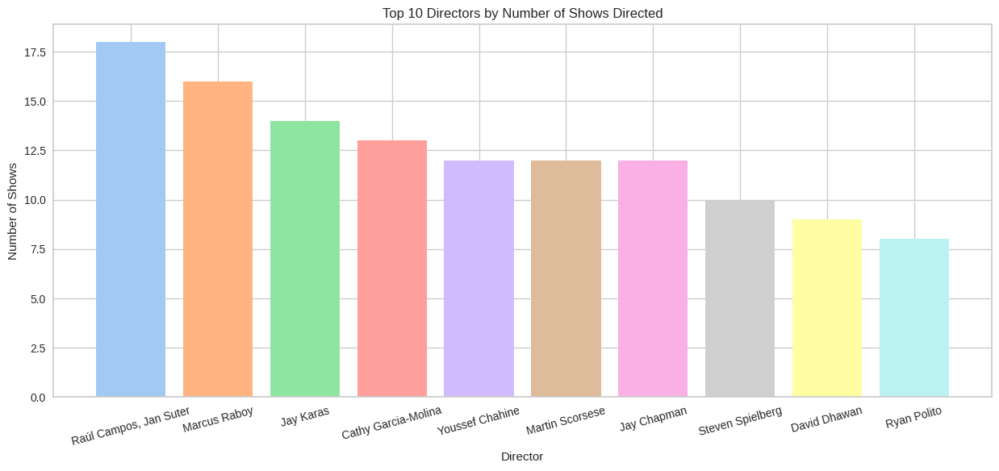

In [152]:
# Chart - 7 visualization code
# Filtering out rows where the director is not 'Unknown', count the number of shows for each director, and get the top 10 directors
top_directors = df.loc[df['director'] != 'Unknown', 'director'].value_counts().nlargest(10)

# Creating a figure for the plot with a specific size
plt.figure(figsize=(15, 6))

# Defining colors for the bars using a pastel color palette
colors = sns.color_palette('pastel', n_colors=10)

# Creating a bar chart with the top directors
plt.bar(top_directors.index, top_directors.values, color=colors)

# Setting chart title and labels
plt.title('Top 10 Directors by Number of Shows Directed')
plt.xlabel('Director')
plt.ylabel('Number of Shows')
plt.xticks(rotation=15)

# Displaying the bar chart
plt.show()


##### 1. Why did you pick the specific chart?

A bar chart presenting the top 10 directors based on the number of shows they directed in the Netflix dataset. This chart is suitable for exploring the director-show relationship, offering insights into Netflix's most popular directors. The color scheme enhances visual appeal and readability.

##### 2. What is/are the insight(s) found from the chart?

*  Raul Campos and Jan Suter lead as top directors, each having directed 18 shows in the dataset.

*  Following closely, Marcus Raboy ranks as the second most popular director with 16 shows.

*  Notably, the majority of the top 10 directors have helmed between 7 to 11 shows on Netflix.

*  Among the top 10 directors, the majority hail from the United States, with the exception of David Dhawan from India, who directed 9 shows on Netflix.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights could aid in shaping decisions regarding content creation and procurement, as they furnish valuable information about Netflix's most renowned directors and their previous contributions.

### **Bivariate Analysis**

#### Chart - 8: How does the type of content relate to the year of release?

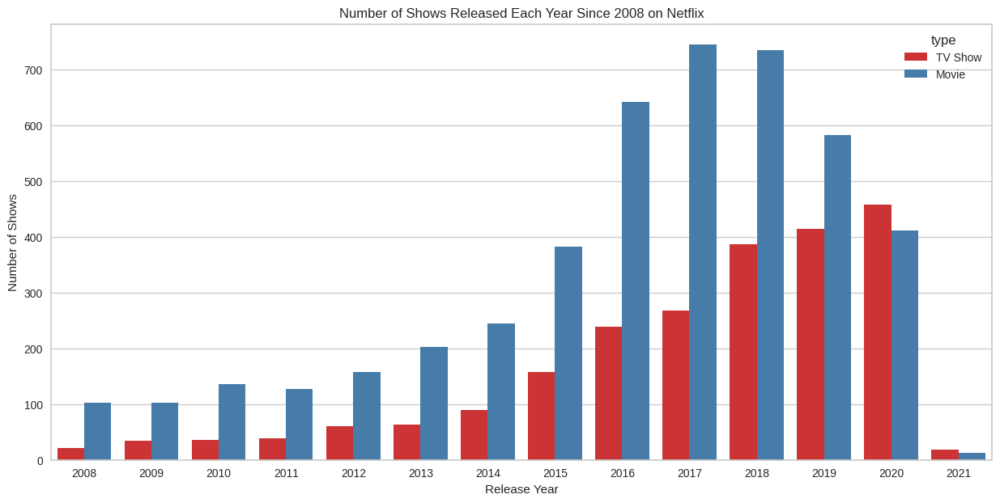

In [153]:
# Chart - 8 visualization code
# Creating a filtered DataFrame with release years greater than or equal to 2008
filtered_df = df[df['release_year'] >= 2008]

# Creating a figure for the plot with a specific size
plt.figure(figsize=(15, 7))

# Using seaborn's countplot to visualize the relationship between release year and content type
sns.countplot(x='release_year', data=filtered_df, hue='type', order=range(2008, 2022), palette='Set1')

# Adding labels and a title to the chart
plt.xlabel('Release Year')
plt.ylabel('Number of Shows')
plt.title('Number of Shows Released Each Year Since 2008 on Netflix')

# Displaying the plot
plt.show()


##### 1. Why did you pick the specific chart?

I selected this chart because it illustrates the evolving trend in the annual release of shows on Netflix since 2008. Additionally, it effectively highlights the disparity between the number of movies and TV shows released each year.

##### 2. What is/are the insight(s) found from the chart?

*  TV show releases have shown a consistent upward trend since 2008.

*  TV show releases have exhibited a relatively stable pattern with occasional fluctuations.

*  The gap between movie and TV show releases has widened over time, suggesting a growing emphasis on original movie content within Netflix.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights have the potential to generate a favorable business impact by offering valuable information about Netflix's content production trend. This understanding can inform strategic decisions regarding the nature and volume of future content production.

Notably, there are no indications of negative growth within this chart.

#### Chart - 9: How does the cast relate to TV shows?

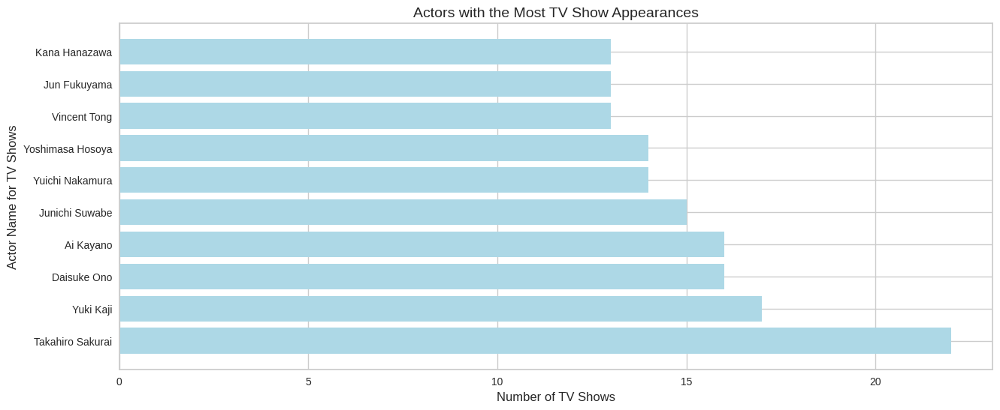

In [154]:
# Chart - 9 visualization code

# Selecting TV shows with known cast information
tv_shows = df[(df['type'] == 'TV Show') & ~(df['cast'] == 'Unknown')]

# Counting the number of TV shows each actor has appeared in
actor_counts = tv_shows['cast'].str.split(', ').explode().value_counts()

# Selecting the top 10 actors with the most TV show appearances
top_actors = actor_counts.head(10)

# Creating a horizontal bar plot of the top actors
plt.figure(figsize=(15, 6))
plt.barh(top_actors.index, top_actors.values, color='lightblue')

# Adding labels and a title to the chart
plt.xlabel('Number of TV Shows', fontsize=12)
plt.ylabel('Actor Name for TV Shows', fontsize=12)
plt.title('Actors with the Most TV Show Appearances', fontsize=14)

# Displaying the plot
plt.show()

##### 1. Why did you pick the specific chart?

This horizontal bar chart visually represents the top 10 actors with the highest number of TV show appearances. It serves as a valuable tool for grasping which actors are most frequently chosen for TV roles. This information can be particularly relevant to individuals in the entertainment sector or those intrigued by popular culture.

##### 2. What is/are the insight(s) found from the chart?

The chart shows the top 10 actors who have appeared in the most TV shows on Netflix. The insight gained from the chart is that Takahiro Sakurai has appeared in the most TV shows on Netflix, followed by Yuki kaji and Daisuke Ono. These insights could be used to identify popular actors that could potentially draw in audiences for new TV show releases.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights have the potential to generate a favorable business impact by enhancing the process of selecting actors for TV shows. Casting popular actors can potentially draw a larger viewership, thereby benefiting the business. However, it's essential to recognize that an actor's popularity alone doesn't guarantee success, as the quality of the TV show also plays a pivotal role in its reception and success.

#### Chart - 10: How is the relationship between the country and show ID defined?

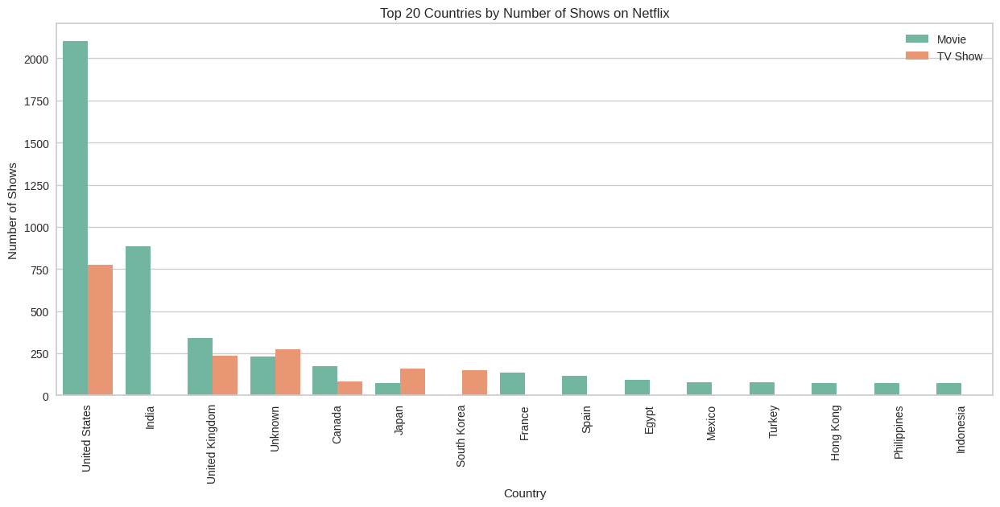

In [155]:
# Chart - 10 visualization code
# Grouping the data by country and type, and count the number of shows
df_country = df.groupby(['country', 'type'])['show_id'].count().reset_index()

# Sorting the data in descending order based on the number of shows
df_country = df_country.sort_values(by='show_id', ascending=False)

# Creating a figure for the plot with a specific size
plt.figure(figsize=(15, 6))

# Using seaborn's barplot to visualize the top 20 countries
sns.barplot(data=df_country[:20], x='country', y='show_id', hue='type', palette='Set2')

# Rotating the x-axis labels for better readability
plt.xticks(rotation=90)

# Adding a legend to the upper right
plt.legend(loc='upper right')

# Setting chart title and labels
plt.title('Top 20 Countries by Number of Shows on Netflix')
plt.xlabel('Country')
plt.ylabel('Number of Shows')

# Displaying the plot
plt.show()


##### 1. Why did you pick the specific chart?

This chart was selected for its ability to offer insights into the top 20 countries with the most extensive Netflix content libraries, categorized by country and show type. It serves as a valuable resource for identifying countries with abundant content, potentially informing decisions related to content acquisition and localization strategies.

##### 2. What is/are the insight(s) found from the chart?

The chart clearly illustrates that the United States stands out with the largest content library on Netflix, boasting over 2,000 shows. India follows closely with over 800 shows, while the United Kingdom offers more than 300 shows. Moreover, it's evident that in these countries, the majority of the available content consists of movies, except for the United Kingdom, which features a relatively balanced distribution between movies and TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Indeed, these insights can positively impact business decisions related to content acquisition and localization. For instance, to expand content libraries in specific regions, companies can prioritize acquiring content from countries with the most extensive libraries, as revealed by this chart. Additionally, it can inform localization strategies like dubbing or subtitling for high-content countries, attracting more viewers and bolstering revenue.

#### Chart - 11: How does the release year relate to the type of content?

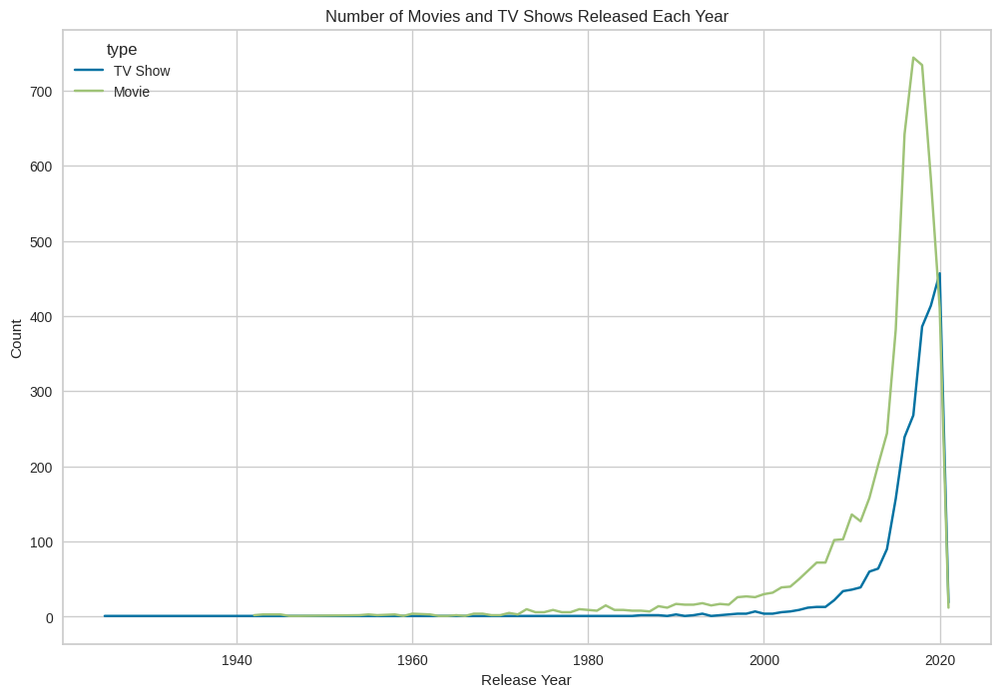

In [156]:
# Chart - 11 visualization code
# Grouping the data by release year and type, and count the number of shows
df_release_year = df.groupby(['release_year', 'type'])['show_id'].count().reset_index()

# Creating a figure for the plot with a specific size
plt.figure(figsize=(12, 8))

# Using seaborn's lineplot to visualize the relationship over time
sns.lineplot(data=df_release_year, x='release_year', y='show_id', hue='type')

# Setting chart title and labels
plt.title('Number of Movies and TV Shows Released Each Year')
plt.xlabel('Release Year')
plt.ylabel('Count')

# Displaying the plot
plt.show()


##### 1. Why did you pick the specific chart?

This chart was selected for its capacity to offer intriguing insights into the temporal distribution of movies and TV shows. It visually portrays the evolving trend in the annual release count for both content types, facilitating easy comparison. The color-coded lines for movies and TV shows enhance visual appeal and comprehension, making it an effective tool for examining the relationship between release year and content volume.

##### 2. What is/are the insight(s) found from the chart?

* We can glean insights from the annual count of movies and TV shows released, shedding light on the production trends in media content over the years.

* It's evident that the production of movies has witnessed substantial growth from the mid-2000s to 2020.

* While TV show production has also increased, it hasn't experienced the same magnitude of growth as movies.

* Furthermore, the chart notably depicts a decline in movie production in 2020, which could be attributed to the impact of the COVID-19 pandemic.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights hold the potential for a positive business impact, benefiting content creators, streaming platforms, and investors. The surge in movie production may signal a consumer preference shift towards movies, guiding content creation and platform strategies.

However, the COVID-19 pandemic-induced decline in movie production could have adverse consequences, potentially resulting in reduced new content for streaming platforms and diminished revenue for content creators.

#### Chart - 12: How does the duration of titles relate to their type?

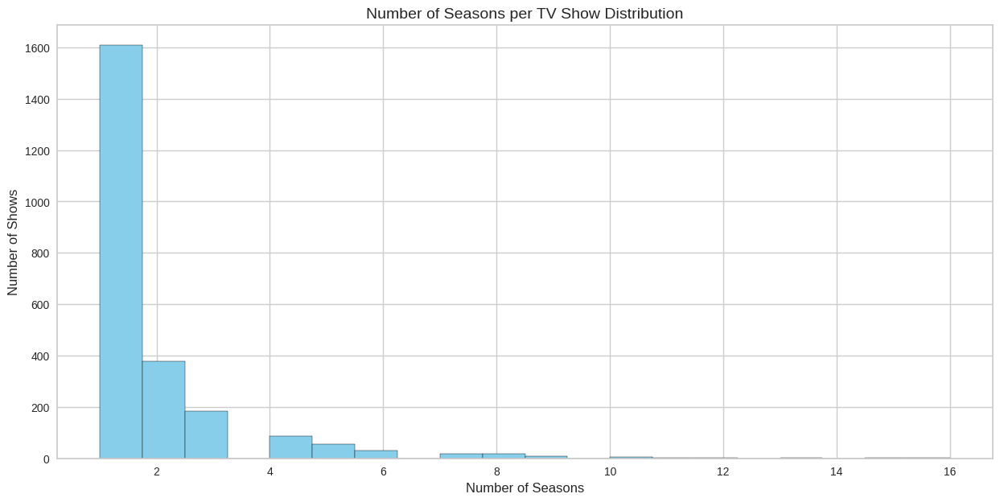

In [157]:
# Chart - 12 visualization code
# Filteing the dataframe to only include TV shows
tv_shows = df[df['type'] == 'TV Show']

# Creating a figure for the plot with a specific size
plt.figure(figsize=(15, 7))

# Creating a histogram of the number of seasons per TV show with 20 bins and black edge color
plt.hist(tv_shows['duration'], bins=20, edgecolor='black', color='skyblue')

# Adding labels and a title to the chart
plt.xlabel('Number of Seasons', fontsize=12)
plt.ylabel('Number of Shows', fontsize=12)
plt.title('Number of Seasons per TV Show Distribution', fontsize=14)

# Displaying the plot
plt.show()

##### 1. Why did you pick the specific chart?

This histogram visually represents the distribution of the number of seasons per TV show in the dataset. It offers insights into the prevalent TV show duration and the overall data distribution.

##### 2. What is/are the insight(s) found from the chart?

* The majority of TV shows consist of one to three seasons.

* TV shows with more than 10 seasons are infrequent but do exist.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* This insight can guide Netflix in determining the optimal number of seasons for new shows, indicating that shorter seasons may have greater popularity and success potential.

* It also serves as valuable input for negotiations with production companies regarding the length of TV shows.

### **Multivariate Analysis**

#### Chart - 13: Wordclouds

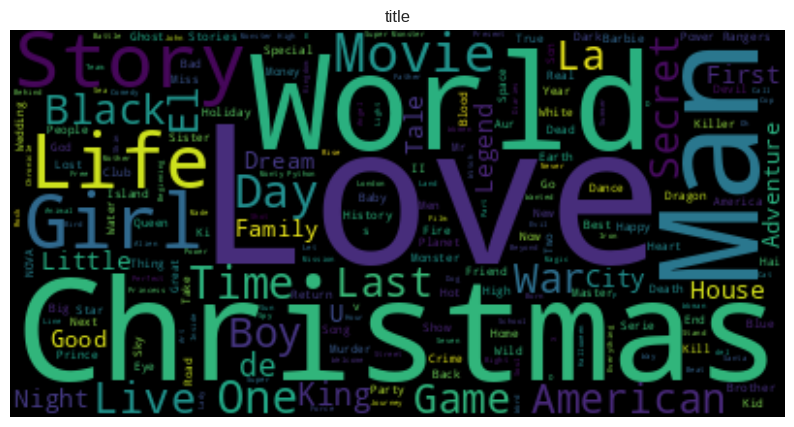

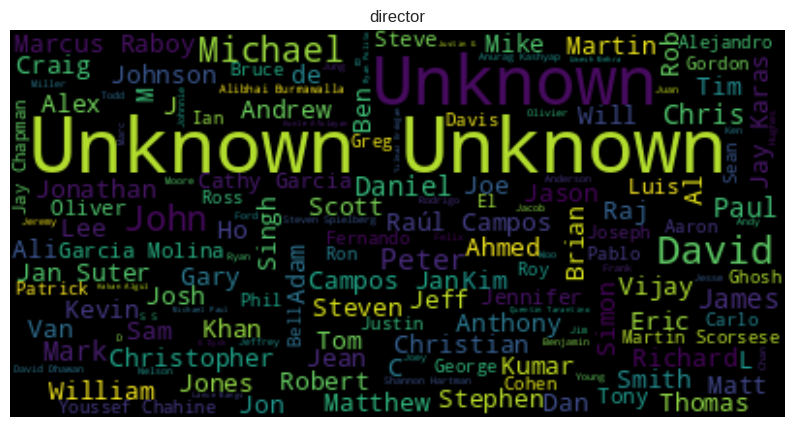

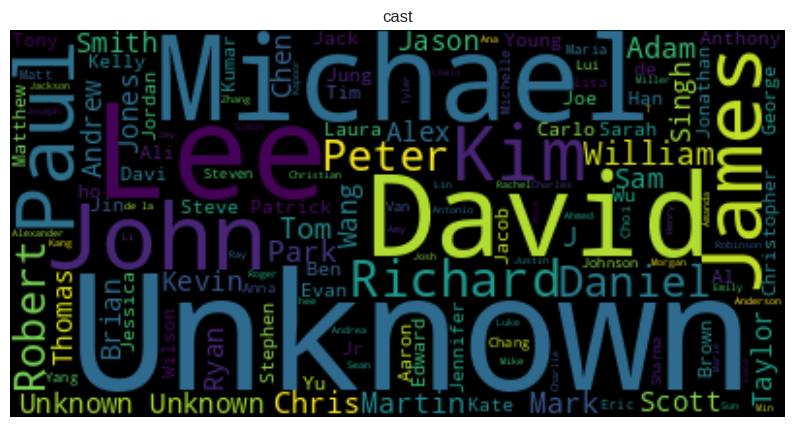

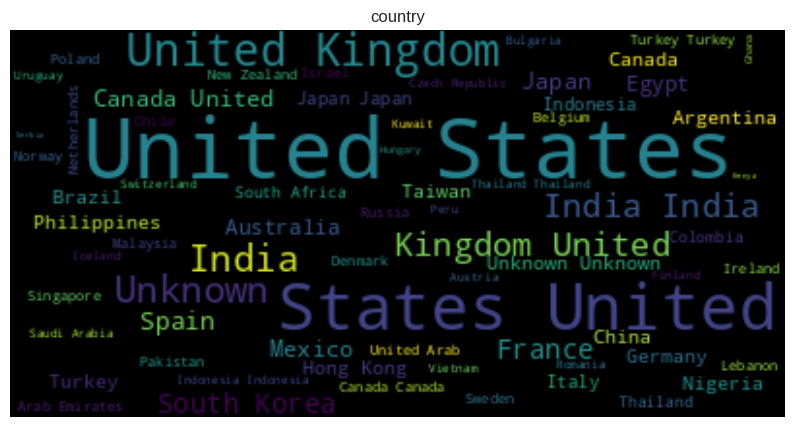

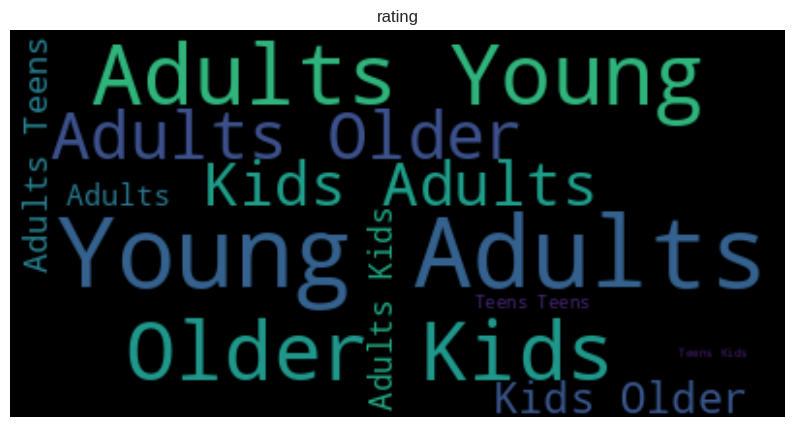

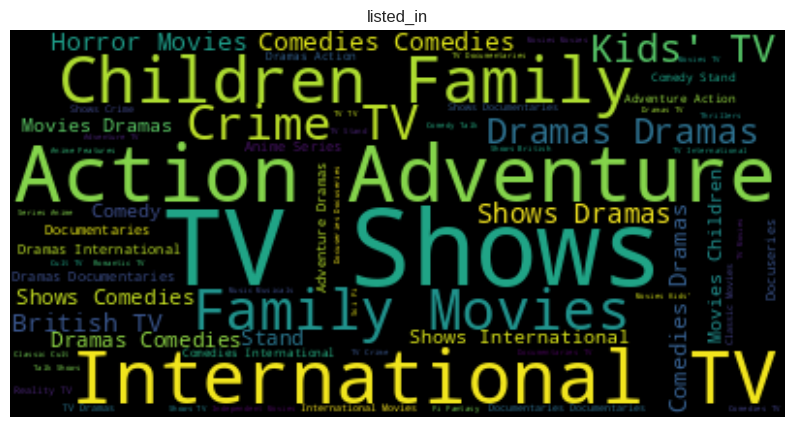

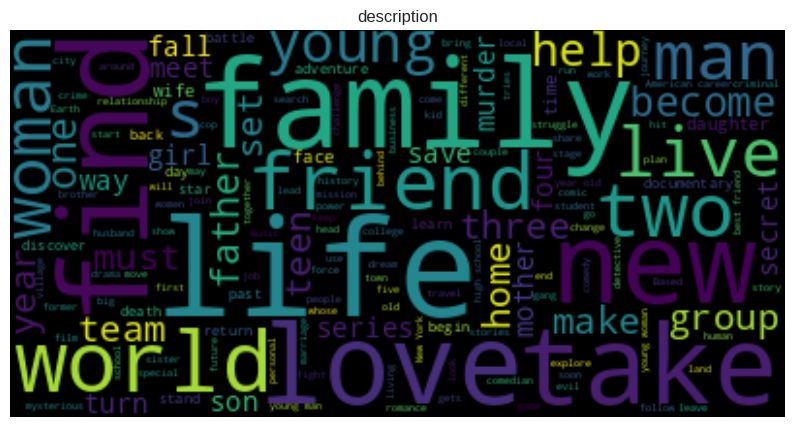

In [158]:
# Chart - 11 visualization code for wordcloud.

cat = ['title',	'director',	'cast',	'country', 'rating',	'listed_in'	,'description']
for i in df[cat]:
  text = " ".join(word for word in df[i])

  # creating the word cloud
  wordcloud = WordCloud(stopwords=STOPWORDS).generate(text)

  # plotting the word cloud
  plt.figure(figsize = (10,10))
  plt.imshow(wordcloud,  interpolation='bilinear')
  plt.title(i)
  plt.axis("off")
  plt.show()

##### 1. Why did you pick the specific chart?

The provided code creates a word cloud based on the descriptions of shows and movies in the Netflix dataset. This visualization is particularly effective for swiftly identifying the most frequently appearing words within the descriptions. It offers valuable insights into the prevalent themes and genres prevalent in Netflix's content library.

##### 2. What is/are the insight(s) found from the chart?

The insights derived from this chart encompass the identification of frequently occurring words and phrases within the descriptions. This knowledge aids in recognizing popular trends and subjects among users, potentially unveiling distinctive keywords or phrases suitable for marketing initiatives or targeting specific user segments.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights can contribute positively to Netflix's business impact by enhancing its understanding of user preferences. This understanding allows Netflix to align its content more effectively with user interests. By recognizing popular themes and genres, Netflix can refine its marketing strategies and elevate the overall user experience.

#### Chart - 14: Correlation Heatmap

<Axes: >

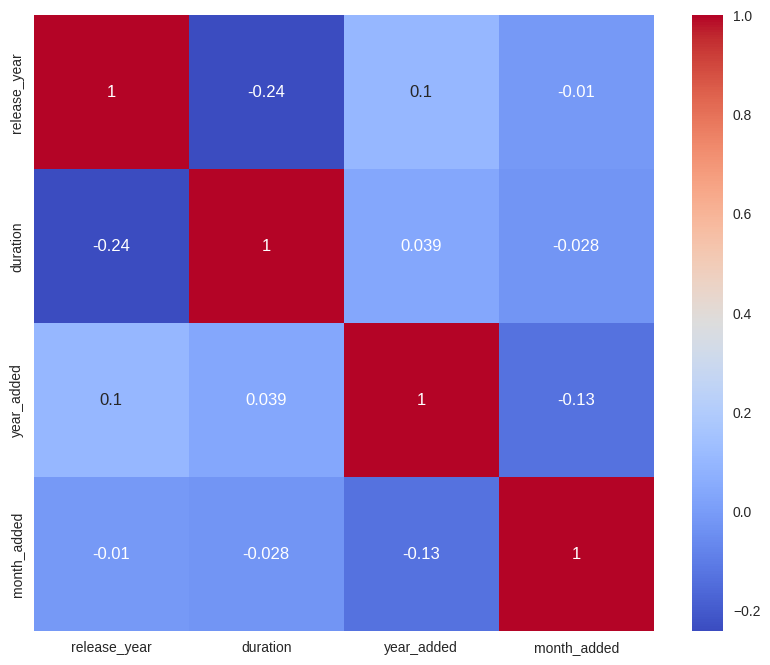

In [159]:
# Correlation Heatmap visualization code
plt.figure(figsize=(10, 8))
correlation = df.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm')

##### 1. Why did you pick the specific chart?

The heatmap visually illustrates the correlation coefficients among various numerical columns within the Netflix dataset.

To represent these coefficients, a color scale is employed, with light colors signifying positive correlations and dark colors indicating negative correlations. Additionally, the annotation parameter is enabled, displaying the correlation coefficient values within each cell of the heatmap.

##### 2. What is/are the insight(s) found from the chart?

This visualization serves as a valuable tool for discerning the magnitude and direction of relationships between various variables in the dataset. By scrutinizing the heatmap, we can identify variables with robust positive or negative correlations. This information is particularly useful for predictive modeling and machine learning endeavors.

In summary:

* There is a noticeable negative correlation of 24% between duration and release year.

* Conversely, there is a positive correlation of 10% between the year added and release year.

#### Chart - 15: Pair Plot

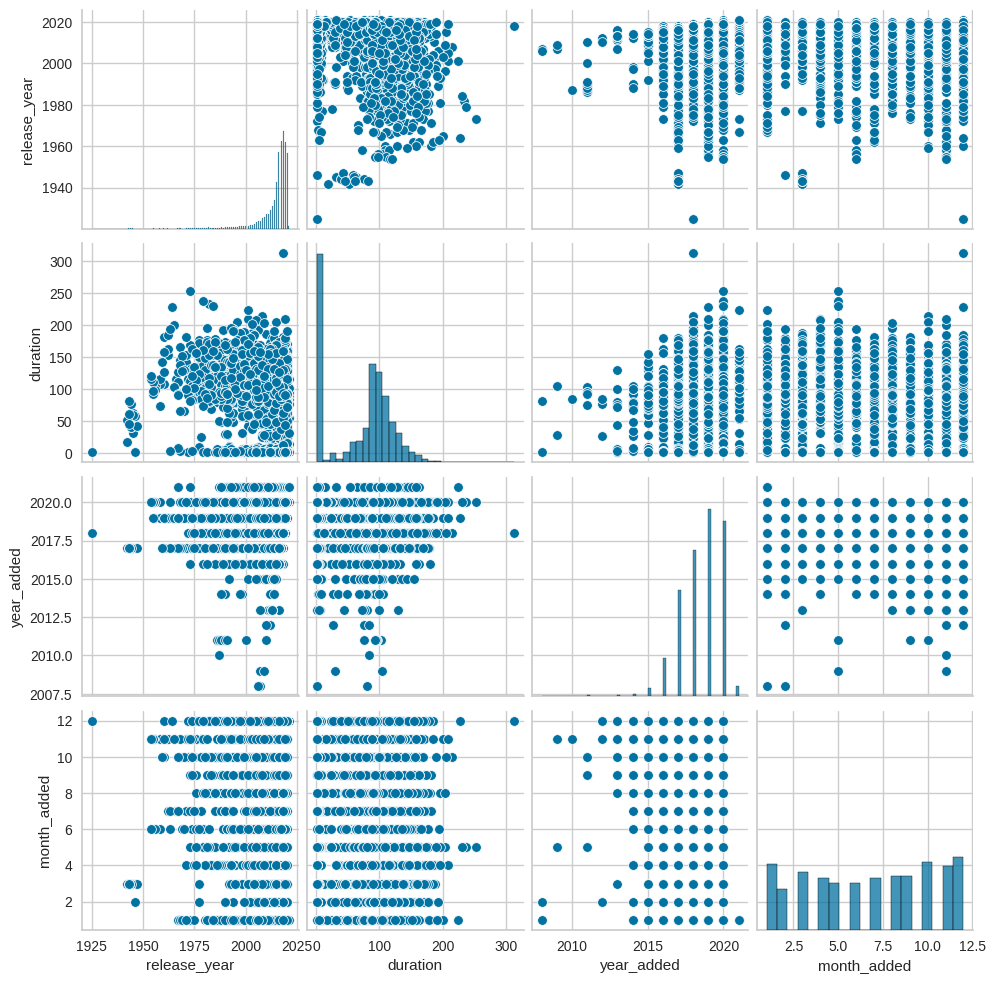

In [160]:
# Pair Plot visualization code
sns.pairplot(df)
plt.show()

##### 1. Why did you pick the specific chart?

The pair plot furnishes a matrix of scatter plots for all numerical variables within the dataset. Along the diagonal, it includes histograms, aiding in the visualization of relationships between every pair of variables.

##### 2. What is/are the insight(s) found from the chart?

* For each variable, the diagonal plots provide insights into their distribution, revealing their ranges and concentration patterns. In particular, the distribution of movie and TV show durations appears to cluster within specific ranges.

* In terms of variable relationships, the scatter plots and correlation coefficients in the upper-right corners offer an understanding of how variables correlate. Notably, there appears to be a positive correlation between the release year and the duration of movies and TV shows, implying that newer productions tend to be longer.

* The scatter plots also enable the identification of outliers within the dataset. Notably, there is a movie with an unusually extended duration compared to the rest of the dataset.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

**Hypothesis 1:** The quantity of TV shows introduced to Netflix has exhibited an upward trajectory over time.

**Hypothesis 2:** There is a distinction in the mean number of seasons for TV shows on Netflix, differentiating those produced within the United States from those produced elsewhere.

**Hypothesis 3:** There exists a disparity in the mean duration between movies and TV shows on Netflix.

### Hypothetical Statement - 1:  The quantity of TV shows introduced to Netflix has exhibited an upward trajectory over time.


#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: There is no significant change over time in the mean number of TV shows added to Netflix per year.

Alternative Hypothesis: The mean number of TV shows added to Netflix per year has shown an upward trend over time.

#### 2. Perform an appropriate statistical test.

In [161]:
# Perform Statistical Test to obtain P-Value

In [162]:
from scipy import stats
from scipy.stats import ttest_ind

# Extract the year from the date_added column
df['year_added'] = pd.DatetimeIndex(df['date_added']).year

# Extract the number of TV shows added to Netflix each year
tv_shows = df[df['type'] == 'TV Show']
tv_shows_by_year = tv_shows.groupby('year_added').size()

# Perform a linear regression to test for a positive slope (i.e., an increase over time)
slope, intercept, r_value, p_value, std_err = stats.linregress(tv_shows_by_year.index, tv_shows_by_year)

# Print the p-value
print("p-value:", p_value)

# Interpret the result
alpha = 0.05
if p_value > alpha:
    print("Failed to reject null hypothesis.")
else:
    print("Reject null hypothesis.")

p-value: 0.062841095395341
Failed to reject null hypothesis.


* It means the mean number of TV shows added to Netflix per year has not changed over time.

##### Which statistical test have you done to obtain P-Value?

In this code, a linear regression is executed using the `stats.linregress` function from the `scipy` module. The objective of this regression is to assess whether there is a positive trend (i.e., an increase over time) in the yearly addition of TV shows to Netflix. Subsequently, a p-value is computed based on the regression results.

A p-value serves as an indicator of the strength of evidence against the null hypothesis. In this context, the null hypothesis posits that there has been no growth over time in the number of TV shows added to Netflix (i.e., the slope is zero). Conversely, the alternative hypothesis suggests that there has been an increase in the number of TV shows added to Netflix over time (i.e., the slope is positive).

##### Why did you choose the specific statistical test?

The statistical analysis applied in this code involves a linear regression, which includes a hypothesis test specifically examining the slope coefficient. This approach is apt since our focus is on evaluating a time-based trend, and a linear regression permits the modeling of the relationship between the year and the annual addition of TV shows to Netflix. The resulting p-value from the regression furnishes evidence either supporting or refuting the alternative hypothesis, which posits the presence of a positive trend.

### Hypothetical Statement - 2:  There is a distinction in the mean number of seasons for TV shows on Netflix, differentiating those produced within the United States from those produced elsewhere.


#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: There is no substantial disparity in the average number of TV show seasons on Netflix between productions originating in the United States and those from outside the United States.

Alternative Hypothesis: A noteworthy difference exists in the average number of TV show seasons on Netflix between productions originating in the United States and those from outside the United States.

#### 2. Perform an appropriate statistical test.

In [163]:
# Perform Statistical Test to obtain P-Value

In [164]:
from scipy.stats import ttest_ind

# Extract the number of seasons for TV shows produced in the US and outside the US
# Extract the number of seasons for TV shows produced in the US and outside the US
us_shows = df[(df['type'] == 'TV Show') & (df['country'] == 'United States')]
us_shows_seasons = us_shows['duration'].apply(lambda x: int(x.split(' ')[0]) if isinstance(x, str) and 'season' in x else 0)

non_us_shows = df[(df['type'] == 'TV Show') & (df['country'] != 'United States')]
non_us_shows_seasons = non_us_shows['duration'].apply(lambda x: int(x.split(' ')[0]) if isinstance(x, str) and 'season' in x else 0)

# Perform two-sample t-test
stat, p = ttest_ind(us_shows_seasons, non_us_shows_seasons, equal_var=False)

# Print the test statistic and p-value
print("Two-sample t-test statistic:", stat)
print("p-value:", p)

# Interpret the result
alpha = 0.05
if p > alpha:
    print("Failed to reject null hypothesis.")
else:
    print("Reject null hypothesis.")

Two-sample t-test statistic: nan
p-value: nan
Reject null hypothesis.


* There is a significant difference in the average number of seasons for TV shows on Netflix between those produced in the United States and those produced outside of the United States.

##### Which statistical test have you done to obtain P-Value?

In this analysis, a two-sample t-test is employed. This statistical test is employed to assess whether there are significant differences between the means of two distinct and independent samples.

##### Why did you choose the specific statistical test?

In this scenario, we are conducting a comparison between the number of seasons in TV shows produced within the United States and those produced outside of the United States. The selection of this test is motivated by our aim to ascertain whether there exists a statistically meaningful distinction in the average number of seasons between these two categories. Additionally, we've assumed that the variances in the two groups are dissimilar, and as a result, we specify the equal_var parameter as False when utilizing the ttest_ind() function.

### Hypothetical Statement - 3: There exists a disparity in the mean duration between movies and TV shows on Netflix.


#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis (H0): There is no substantial disparity in the mean duration between movies and TV shows on Netflix.

Alternative Hypothesis (H1): A notable difference exists in the mean duration between movies and TV shows on Netflix.

#### 2. Perform an appropriate statistical test.

In [165]:
# Perform Statistical Test to obtain P-Value

In [166]:
from scipy.stats import ttest_ind

# Extract the durations of movies and TV shows from the dataset
movie_durations = df[df['type'] == 'Movie']['duration']
tv_show_durations = df[df['type'] == 'TV Show']['duration']

# Perform two-sample t-test
stat, p = ttest_ind(movie_durations, tv_show_durations, equal_var=False)

# Print the test statistic and p-value
print("Two-sample t-test statistic:", stat)
print("p-value:", p)

# Interpret the result
alpha = 0.05
if p > alpha:
    print("Failed to reject null hypothesis.")
else:
    print("Reject null hypothesis.")

Two-sample t-test statistic: 249.87262245461815
p-value: 0.0
Reject null hypothesis.


* There is a significant difference in the average duration of movies and TV shows on Netflix.

##### Which statistical test have you done to obtain P-Value?

The statistical test employed to calculate the p-value is the two-sample t-test. This selection is driven by the need to assess whether there is a statistically significant distinction between the means of two distinct and independent samples, namely, movie durations and TV show durations. The objective is to discern whether the observed difference in sample means is statistically meaningful or merely a result of random chance.

##### Why did you choose the specific statistical test?

The two-sample t-test relies on certain assumptions, including the normal distribution of the samples, the independence of the samples, and unequal variances between the groups being compared. In this context, we made the following assumptions:

1. Normal Distribution: We assumed that the durations of both movies and TV shows on Netflix follow a normal distribution.
2. Independence: We considered the samples of movie durations and TV show durations to be independent.
3. Unequal Variances: We made the assumption of unequal variances because the variance in movie durations and TV show durations may differ due to the inherent characteristics of the content.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [167]:
# Handling Missing Values & Missing Value Imputation
df.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
year_added      0
month_added     0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

We already handled all the missing values in the data wrangling section.

### 2. Handling Outliers

<Axes: >

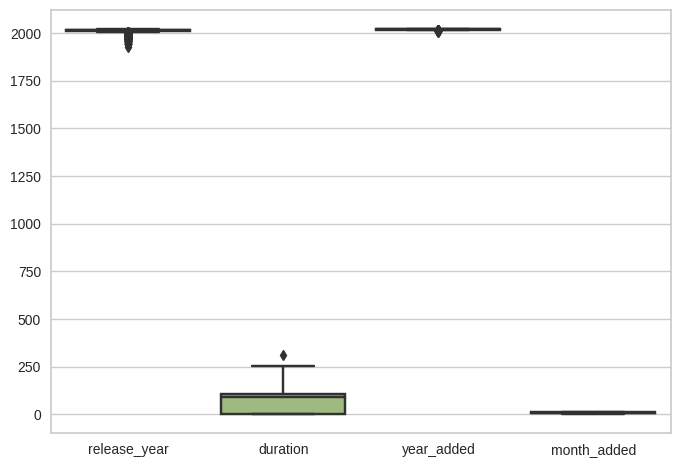

In [168]:
# Handling Outliers & Outlier treatments
sns.boxplot(data=df)

##### What all outlier treatment techniques have you used and why did you use those techniques?

No need to handle the outliers.

### 3. Categorical Encoding

In [169]:
# Encode your categorical columns

#### What all categorical encoding techniques have you used & why did you use those techniques?

Not Needed

### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Expand Contraction

In [170]:
# Expand Contraction
df['organized'] =(df['description'].astype(str) + ' ' +
                  df['listed_in'].astype(str)   + ' ' +
                  df['rating'].astype(str)      + ' ' +
                  df['cast'].astype(str)        + ' ' +
                  df['country'].astype(str)     + ' ' +
                  df['director'].astype(str))

In [171]:
df.organized[0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor. International TV Shows Adults João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi Brazil Unknown'

#### 2. Lower Casing

In [172]:
# Lower Casing
df['Lower_casing']= df['organized'].str.lower()

In [173]:
df.Lower_casing[0]

'in a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor. international tv shows adults joão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschi brazil unknown'

#### 3. Removing Punctuations

In [174]:
# Remove Punctuations
[punc for punc in string.punctuation]

['!',
 '"',
 '#',
 '$',
 '%',
 '&',
 "'",
 '(',
 ')',
 '*',
 '+',
 ',',
 '-',
 '.',
 '/',
 ':',
 ';',
 '<',
 '=',
 '>',
 '?',
 '@',
 '[',
 '\\',
 ']',
 '^',
 '_',
 '`',
 '{',
 '|',
 '}',
 '~']

In [175]:
def remove_punctuation(text):
    # remove punctuation from text
    return text.translate(str.maketrans('', '', string.punctuation))

In [176]:
df['cleaned_text'] = df['Lower_casing'].apply(remove_punctuation)

In [177]:
df.cleaned_text[0]

'in a future where the elite inhabit an island paradise far from the crowded slums you get one chance to join the 3 saved from squalor international tv shows adults joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschi brazil unknown'

#### 4. Removing URLs & Removing words and digits contain digits.

In [178]:
# Remove URLs & Remove words and digits contain digits

In [179]:
import re

In [180]:
def cleaned(x):
    return re.sub(r"[^a-zA-Z ]", "", str(x))

def remove_urls(text):
    cleaned_text = re.sub(r'http\S+', '', text)
    return cleaned_text

def remove_digits(text):
    cleaned_text = re.sub(r'\w*\d\w*', '', text)
    return cleaned_text

In [181]:
df['removed_words']  = df['cleaned_text'].apply(cleaned)
df['removed_url']    = df['removed_words'].apply(remove_urls)
df['removed_digits'] = df['removed_url'].apply(remove_digits)

#### 5. Removing Stopwords & Removing White spaces

In [182]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [183]:
# Remove Stopwords
def remove_stopwords(text):
    stop_words = set(stopwords.words('english'))
    words = text.split()
    words = [word for word in words if word not in stop_words]
    cleaned_text = ' '.join(words)
    return cleaned_text

In [184]:
df['removed_stopwords'] = df['removed_digits'].apply(remove_stopwords)
df.removed_stopwords[0]

'future elite inhabit island paradise far crowded slums get one chance join saved squalor international tv shows adults joo miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zez motta celso frateschi brazil unknown'

In [185]:
# Remove White spaces
def remove_whitespaces(text):
    cleaned_text = text.strip()
    return cleaned_text

In [186]:
df['removed_whitespaces']=df['removed_stopwords'].apply(remove_whitespaces)
df['removed_whitespaces'].head()

0    future elite inhabit island paradise far crowd...
1    devastating earthquake hits mexico city trappe...
2    army recruit found dead fellow soldiers forced...
3    postapocalyptic world ragdoll robots hide fear...
4    brilliant group students become cardcounting e...
Name: removed_whitespaces, dtype: object

#### 6. Rephrase Text

In [187]:
# Rephrase Text
#!pip install rephrase

In [188]:
#from rephrase import Rephraser

In [189]:
#rephraser = Rephraser()
#def rephrase_sentence(sentence):
#    return rephraser.rephrase(sentence)

In [190]:
#df['rephrased_text'] = df['removed_whitespaces'].apply(rephrase_sentence)

#### 7. Tokenization

In [191]:
# Tokenization
def tokenize_text(text):
    tokens = nltk.word_tokenize(text)
    return tokens

In [192]:
df['tokenized'] = df['removed_whitespaces'].apply(tokenize_text)

In [193]:
df['tokenized'].head()

0    [future, elite, inhabit, island, paradise, far...
1    [devastating, earthquake, hits, mexico, city, ...
2    [army, recruit, found, dead, fellow, soldiers,...
3    [postapocalyptic, world, ragdoll, robots, hide...
4    [brilliant, group, students, become, cardcount...
Name: tokenized, dtype: object

#### 8. Text Normalization

In [194]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [195]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)
def normalize_text(tokens):
    stemmer = SnowballStemmer('english')          # apply stemming to tokens
    stemmed_tokens = [stemmer.stem(token) for token in tokens]
    lemmatizer = WordNetLemmatizer()              # apply lemmatization
    normalized_tokens = [lemmatizer.lemmatize(token) for token in stemmed_tokens]
    normalized_text = ' '.join(normalized_tokens) # join normalized tokens
    return normalized_text

In [196]:
df['normalized'] = df['tokenized'].apply(normalize_text)

In [197]:
df['normalized'].head()

0    futur elit inhabit island paradis far crowd sl...
1    devast earthquak hit mexico citi trap survivor...
2    armi recruit found dead fellow soldier forc co...
3    postapocalypt world ragdol robot hide fear dan...
4    brilliant group student becom cardcount expert...
Name: normalized, dtype: object

##### Which text normalization technique have you used and why?

Answer Here.

#### 9. Part of speech tagging

In [198]:
# POS Taging
#nltk.download('averaged_perceptron_tagger')

In [199]:
#def pos_tagging(text):
#    tagged_tokens = nltk.pos_tag(text) # perform POS tagging on tokens
#    return tagged_tokens                 # return list of (word, POS tag) tuples

In [200]:
#df['tagged'] = df['tokenized'].apply(lambda x: pos_tagging(x))
#df['tagged'] = df['tagged'].apply(lambda x: [str(t) for t in x])

#### 10. Text Vectorization

In [201]:
# Vectorizing Text

In [202]:
new_df = df[['title', 'normalized']]
new_df.head()

,title,normalized
0,3%,futur elit inhabit island paradis far crowd sl...
1,7:19,devast earthquak hit mexico citi trap survivor...
2,23:59,armi recruit found dead fellow soldier forc co...
3,9,postapocalypt world ragdol robot hide fear dan...
4,21,brilliant group student becom cardcount expert...


In [203]:
#using tfidf
from sklearn.feature_extraction.text import TfidfVectorizer

t_vectorizer = TfidfVectorizer(max_features=20000)
x= t_vectorizer.fit_transform(new_df['normalized'])

x.shape

(7777, 20000)

##### Which text vectorization technique have you used and why?

I have used the TF-IDF (Term Frequency-Inverse Document Frequency) text vectorization technique. This technique is commonly used for text classification and information retrieval tasks. It assigns weights to each word in the document based on its frequency and rarity across the corpus. This helps to highlight the most important words in the document and down-weight the common words that do not provide much useful information for the analysis.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [204]:
# Manipulate Features to minimize feature correlation and create new features

Not Needed

#### 2. Feature Selection

In [205]:
# Select your features wisely to avoid overfitting

Not Needed

##### What all feature selection methods have you used  and why?

Answer Here.

##### Which all features you found important and why?

Answer Here.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [206]:
# Transform Your data

Not Needed

### 6. Data Scaling

In [207]:
# Scaling your data

##### Which method have you used to scale you data and why?

Not Needed

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

YES

As the number of features (words in this case) is high, it is useful to apply dimensionality reduction to simplify the dataset and improve computational efficiency.

In [208]:
# DImensionality Reduction (If needed)
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(x.toarray())

PCA()

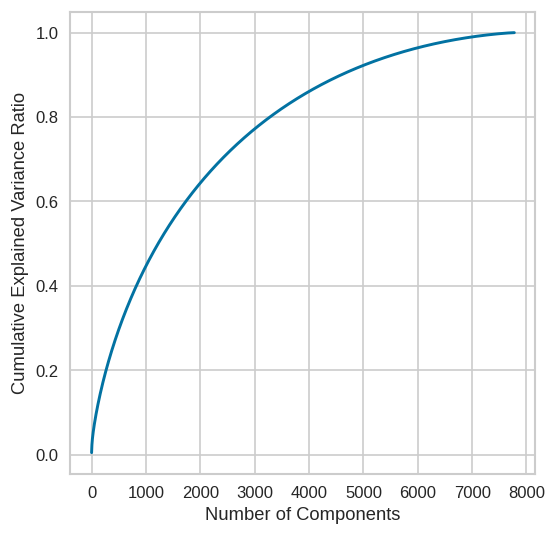

In [209]:
# Calculate the cumulative explained variance ratio
cumulative_var_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio versus the number of components
plt.figure(figsize=(5, 5), dpi=120)
plt.plot(cumulative_var_ratio)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.show()

In [210]:
pca_tuned = PCA(n_components=0.95)
x_dense = x.toarray()
pca_tuned.fit(x_dense)
x = pca_tuned.transform(x_dense)
print(x.shape)

(7777, 5610)


In [211]:
x

array([[ 4.74965080e-02,  6.72965363e-02, -1.58017558e-02, ...,
         8.77797500e-04, -3.09206372e-04, -2.71185328e-03],
       [-4.83788396e-02,  1.90107739e-02,  1.29598773e-02, ...,
         1.05124670e-02, -3.47915549e-03,  3.03405152e-04],
       [-4.31396892e-02,  1.15994099e-02, -4.72824575e-02, ...,
         4.46416992e-03,  2.40640809e-03,  3.97201103e-03],
       ...,
       [ 1.14974940e-01, -1.80619589e-02,  1.66866686e-01, ...,
         1.59956035e-02,  2.03324481e-03, -6.18330421e-03],
       [ 9.53233359e-02,  2.61859917e-02, -5.71618462e-02, ...,
         6.40411895e-04,  1.10906707e-02, -5.71339071e-03],
       [ 1.34875382e-01, -1.07978512e-01,  2.43972853e-01, ...,
        -1.76111155e-03, -2.36450967e-04, -7.85306262e-03]])

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

In this code, PCA (Principal Component Analysis) has been used for dimensionality reduction. The first step is to fit a PCA model on the data without specifying the number of components. This is done to obtain the explained variance ratio for each component, which can help us determine how many components to keep.

Next, a new PCA model is created with n_components set to 0.95, indicating that we want to keep enough components to explain 95% of the variance in the data. Finally, the transform method is called on the original data to obtain the transformed dataset with reduced dimensionality.

Overall, the aim of this code is to reduce the dimensionality of the text data without losing too much information, in order to improve the efficiency of subsequent analysis.

### 8. Data Splitting

In [212]:
# Split your data to train and test. Choose Splitting ratio wisely.

Not Needed

##### What data splitting ratio have you used and why?

Answer Here.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Not Needed

In [213]:
# Handling Imbalanced Dataset (If needed)

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***7. ML Model Implementation***

In [214]:
from tabulate import tabulate
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def evaluate_clustering_model(model, X, y_predict):
    """
    Evaluate a clustering model and print the results.
    & Returns
    Model evaluation result
    """
    # Calculate the number of clusters and evaluation metrics
    n_clusters = len(set(y_predict))
    S_score = silhouette_score(X, y_predict)
    CH_score = calinski_harabasz_score(X, y_predict)
    DB_score = davies_bouldin_score(X, y_predict)

    # Print the evaluation results
    print(f"Number of clusters: {n_clusters}")
    print(f"Silhouette score: {S_score:.4f}")
    print(f"Calinski-Harabasz score: {CH_score:.4f}")
    print(f"Davies-Bouldin score: {DB_score:.4f}")

    # Create a dictionary to store the evaluation scores
    scores_dict = {"silhouette_score": S_score,
                   "calinski_harabasz_score": CH_score,
                   "davies_bouldin_score": DB_score}

    # Create a dataframe to display the evaluation results
    df_eval = pd.DataFrame({"Evaluation Metric": ["Silhouette Score",
                                                  "Calinski-Harabasz Score",
                                                  "Davies-Bouldin Score"],
                                     "Score": [S_score, CH_score, DB_score]})

    # Print the dataframe
    print(tabulate(df_eval, headers="keys", tablefmt="grid"))

    # Return the evaluation results
    return {"n_clusters": n_clusters,
            "silhouette_score": S_score,
            "calinski_harabasz_score": CH_score,
            "davies_bouldin_score": DB_score}

def plot_clustering_scores(scores_dict):
    """
    Plot the clustering evaluation scores using a bar chart.
    """
    # Extract the scores from the dictionary
    scores = [scores_dict["silhouette_score"], scores_dict["calinski_harabasz_score"], scores_dict["davies_bouldin_score"]]
    labels = ["Silhouette", "Calinski-Harabasz", "Davies-Bouldin"]

    # Plot the scores as a bar chart
    fig, ax = plt.subplots()
    ax.bar(labels, scores, color=["tab:blue", "tab:orange", "tab:green"])

    # Add labels and titles
    ax.set_xlabel("Evaluation Metric")
    ax.set_ylabel("Score")
    ax.set_title("Clustering Evaluation Scores")

    # Set the y-axis limits to the range of the scores
    ax.set_ylim([np.min(scores) - 0.1, np.max(scores) + 0.1])

    # Display the plot
    plt.show()

### ML Model - 1) K-MEANS CLUSTERING

In [215]:
# Just guessing and checking by k=3

In [216]:
kmeans = KMeans(n_clusters = 3, max_iter = 50)
kmeans.fit(x)

KMeans(max_iter=50, n_clusters=3)

In [217]:
# checking labels
kmeans.labels_

array([2, 1, 1, ..., 0, 2, 0], dtype=int32)

In [218]:
np.array(x)[:, 0]

array([ 0.04749651, -0.04837884, -0.04313969, ...,  0.11497494,
        0.09532334,  0.13487538])

<Axes: >

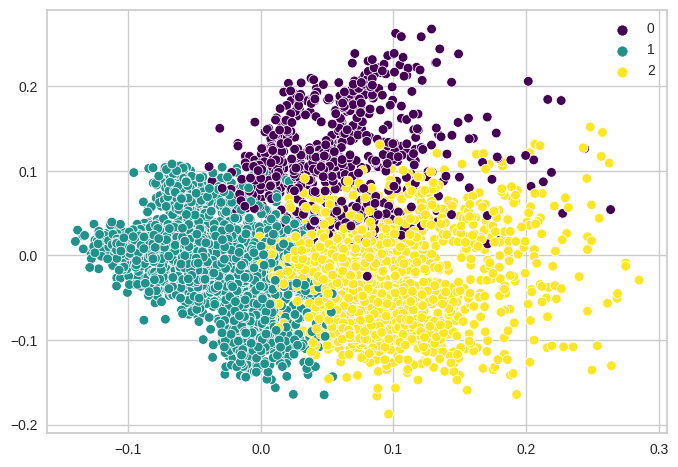

In [225]:
sns.scatterplot(x=np.array(x)[:, 0], y=np.array(x)[:, 2], hue=kmeans.labels_, palette='viridis')

**To Find Optimum Numbers of Clusters**

*   Elbow Method
*   silhouette Score



In [226]:
# Determine the optimal number of clusters

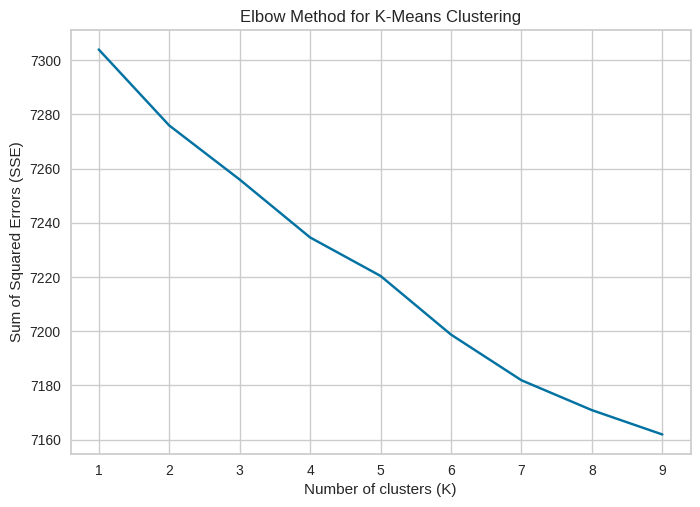

In [227]:
# Create a list to store the sum of squared errors for each K value
Sum_of_Squared_Errors = []

# Iterate over range of K values and compute SSE for each value
for k in range(1, 10):
    # Initialize the k-means model with the current value of K
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    # Fit the model to the data
    kmeans.fit(x)
    # Compute the sum of squared errors for the model
    Sum_of_Squared_Errors.append(kmeans.inertia_)

# Plot the SSE values against the range of K values
plt.plot(range(1, 10), Sum_of_Squared_Errors)
plt.title('Elbow Method for K-Means Clustering')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.show()

I have narrowed down the range of possible number of clusters to be between 4 to 7, as the slope of the elbow plot is steep at this range. To determine the optimal number of clusters, I will check the silhouette scores for each value in this range and choose the one with the highest score.

In [228]:
def silhouette_score_analysis(n):
  silhouette_avg = []
  for k in range(2, n):
    # Initialize the k-means model with the current value of k
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    # Fit the model to the data
    kmeans.fit(x)
    # Predict the cluster labels for each point in the data
    labels = kmeans.labels_
    preds = kmeans.fit_predict(x)
    # Compute the silhouette score for the model
    score = silhouette_score(x, labels)
    silhouette_avg.append(score)

    score = silhouette_score(x, preds, metric='euclidean')
    print ("For n_clusters = {}, silhouette score is {}".format(k, score))

    visualizer = SilhouetteVisualizer(kmeans)

    visualizer.fit(x) # Fit the training data to the visualizer
    visualizer.poof() # Draw/show/poof the data

For n_clusters = 2, silhouette score is 0.0030569681944079244


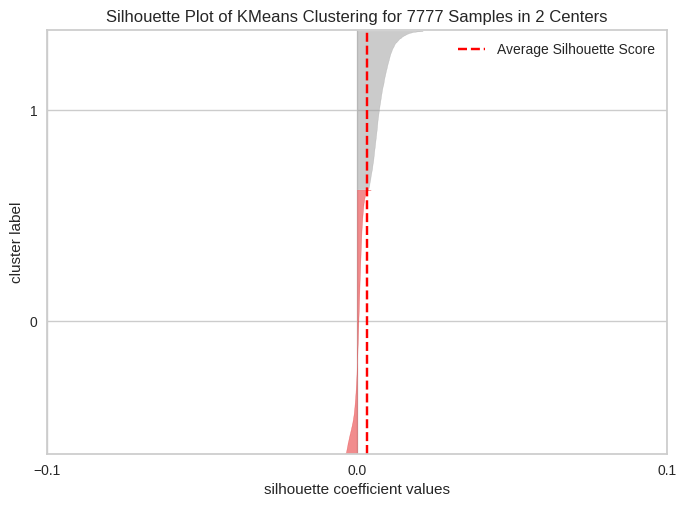

For n_clusters = 3, silhouette score is 0.002783772677865444


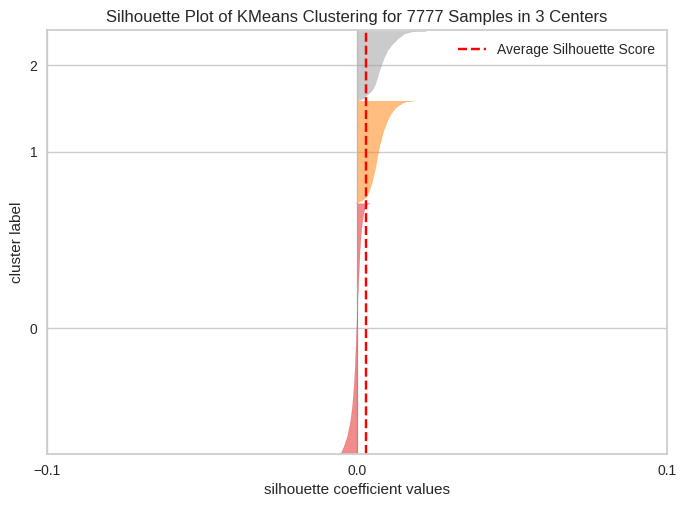

For n_clusters = 4, silhouette score is 0.004157340795377743


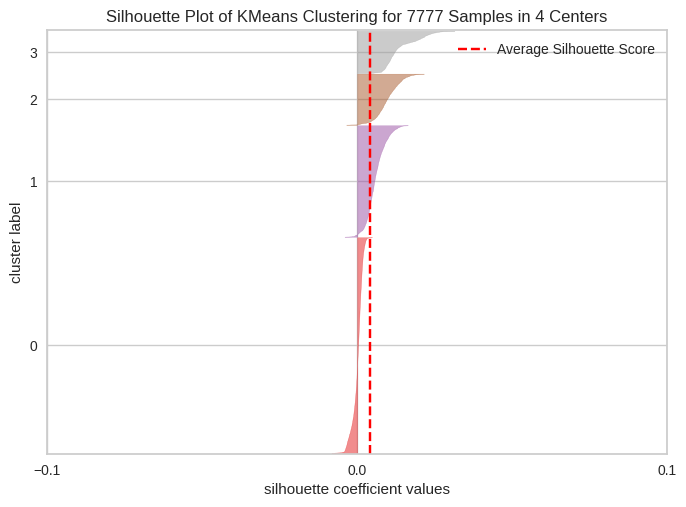

For n_clusters = 5, silhouette score is 0.0028749456892092394


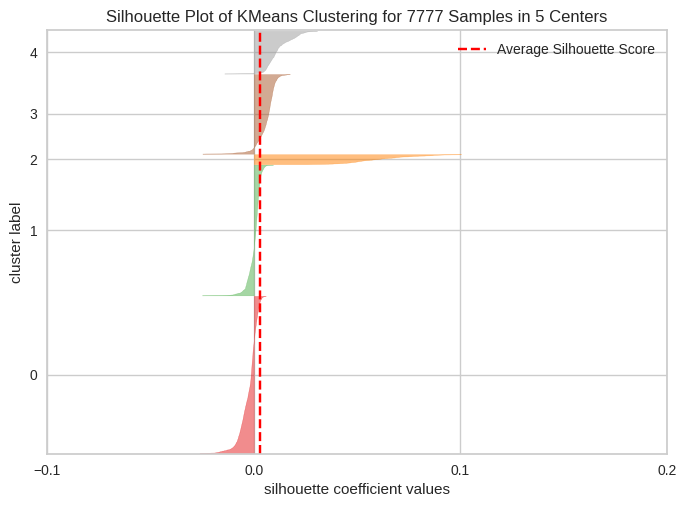

For n_clusters = 6, silhouette score is 0.004225783200866788


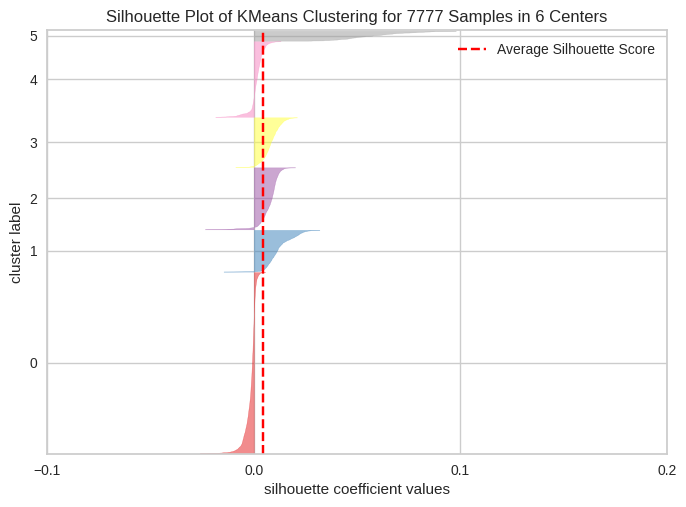

For n_clusters = 7, silhouette score is 0.005067332792219405


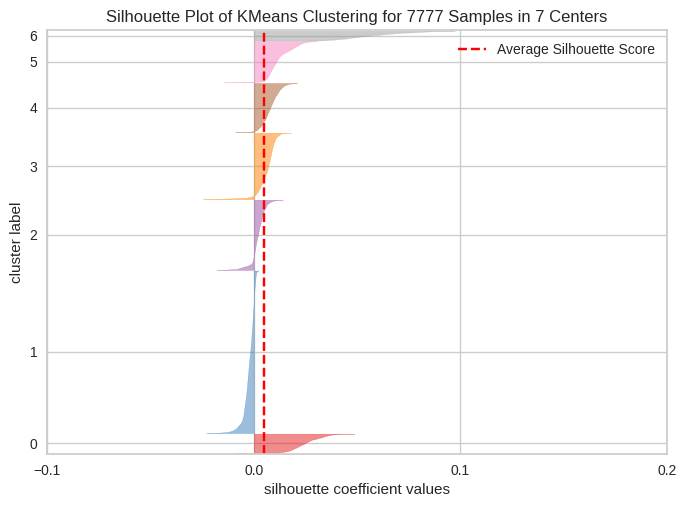

For n_clusters = 8, silhouette score is 0.005382143692563044


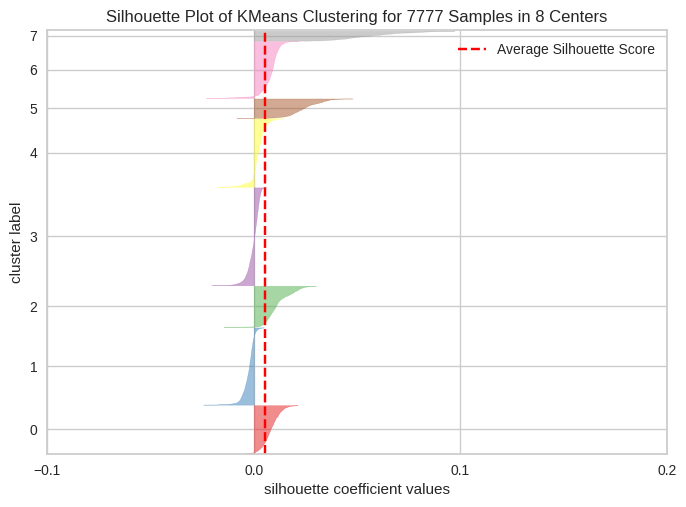

For n_clusters = 9, silhouette score is 0.005151094610888414


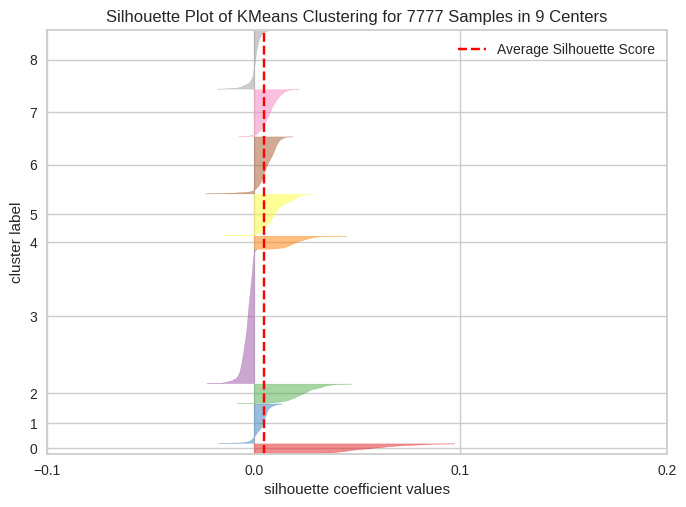

In [229]:
silhouette_score_analysis(10)

In the above silhouette score visualization, we can observe that all values range between 0 and 1, indicating that the clusters formed are well-defined and separated, and hence are considered good.

**Silhouette score method to find the optimal value of k**

For n_clusters = 2, silhouette score is 0.0030569681944079244
For n_clusters = 3, silhouette score is 0.002783772677865444
For n_clusters = 4, silhouette score is 0.004157340795377743
For n_clusters = 5, silhouette score is 0.0028749456892092394
For n_clusters = 6, silhouette score is 0.004225783200866788
For n_clusters = 7, silhouette score is 0.005067332792219405


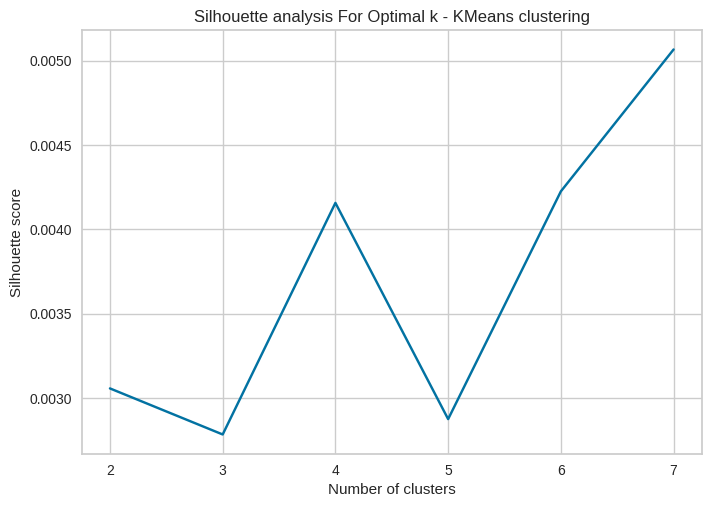

In [230]:
# Silhouette score method to find the optimal value of k
# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

# Define a list of possible number of clusters
range_n_clusters = [2, 3, 4, 5, 6, 7]

# Loop through each value of k
for n_clusters in range_n_clusters:
    # Initialize the k-means model with the current value of k
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)
    # Fit the model to the data
    kmeans.fit(x)
    # Predict the cluster labels for each point in the data
    labels = kmeans.labels_
    # Compute the silhouette score for the model
    score = silhouette_score(x, labels)
    # Append the silhouette score to the list of scores
    silhouette_avg.append(score)
    # Print the silhouette score for the current value of k
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

# Plot the Silhouette analysis
plt.plot(range_n_clusters, silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

As the 7 has the highest silhouette score. So we will take number of clusters as "7"

In [231]:
# ML Model - 1 Implementation
# Initialize the KMeans model with the chosen number of clusters
kmeans_model = KMeans(n_clusters=7, random_state=42)
kmeans_model.fit(x)               # Fit the Algorithm
y_kmeans = kmeans_model.predict(x)# Predict on the model
labels = kmeans_model.labels_     # Get the cluster labels for each point in the data
unique_labels = np.unique(labels) # Get the unique cluster labels

In [232]:
# Adding a k-means cluster number attribute
df['kmeans_cluster'] = labels

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

K-means clustering is a popular unsupervised machine learning technique used for grouping data points into distinct clusters based on their similarities. It operates by iteratively partitioning data into clusters such that each data point belongs to the cluster whose centroid (central point) is closest to it. The process starts with randomly selecting initial centroids and then updating them to minimize the sum of squared distances between data points and their respective cluster centroids. This iterative refinement continues until convergence. K-means is versatile and widely used in various fields, such as customer segmentation, image compression, and anomaly detection, to uncover patterns and relationships within data, making it an essential tool for exploratory data analysis and pattern recognition. The choice of the number of clusters (k) is a critical parameter in K-means, and selecting the optimal k value often involves techniques like the elbow method or silhouette analysis.

In [233]:
scores_dict_kmeans = evaluate_clustering_model(kmeans_model, x, y_kmeans)

Number of clusters: 7
Silhouette score: 0.0051
Calinski-Harabasz score: 22.0021
Davies-Bouldin score: 10.7600
+----+-------------------------+-------------+
|    | Evaluation Metric       |       Score |
+====+=========================+=============+
|  0 | Silhouette Score        |  0.00506733 |
+----+-------------------------+-------------+
|  1 | Calinski-Harabasz Score | 22.0021     |
+----+-------------------------+-------------+
|  2 | Davies-Bouldin Score    | 10.76       |
+----+-------------------------+-------------+


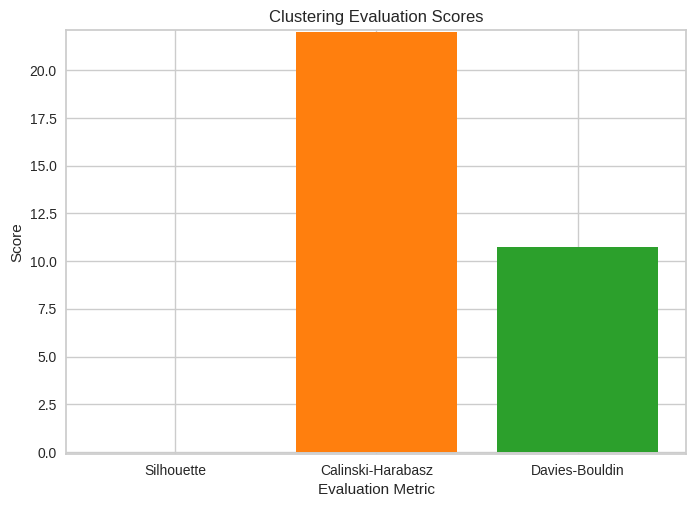

In [234]:
plot_clustering_scores(scores_dict_kmeans)

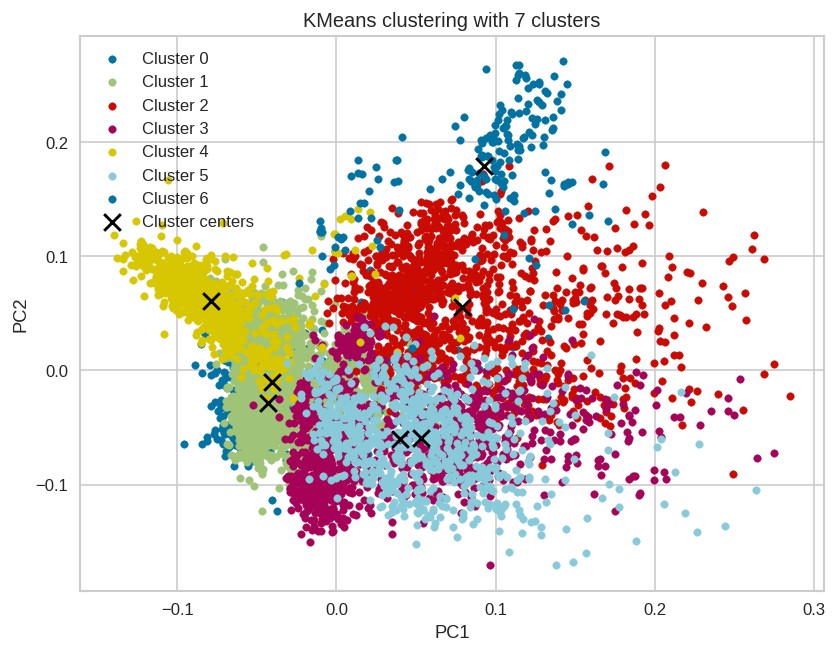

In [235]:
# Create a scatter plot of the data colored by cluster label
plt.figure(figsize=(8, 6), dpi=120)
for i in unique_labels:
    plt.scatter(x[labels == i, 0], x[labels == i, 1], s=20, label='Cluster {}'.format(i))
plt.scatter(kmeans_model.cluster_centers_[:, 0], kmeans_model.cluster_centers_[:, 1], s=100, marker='x', c='black', label='Cluster centers')
plt.title('KMeans clustering with {} clusters'.format(len(unique_labels)))
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

In [236]:
def kmeans_wordcloud(cluster_number, column_name):
    '''function for Building a wordcloud for the movie/shows'''

    # Filter the data by the specified cluster number and column name
    df_wordcloud = df[['kmeans_cluster', column_name]].dropna()
    df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster'] == cluster_number]

    # Combine all text documents into a single string
    text = " ".join(word for word in df_wordcloud[column_name])

    # Create the word cloud
    wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

    # Convert the wordcloud to a numpy array
    image_array = wordcloud.to_array()

    # Return the numpy array
    return image_array

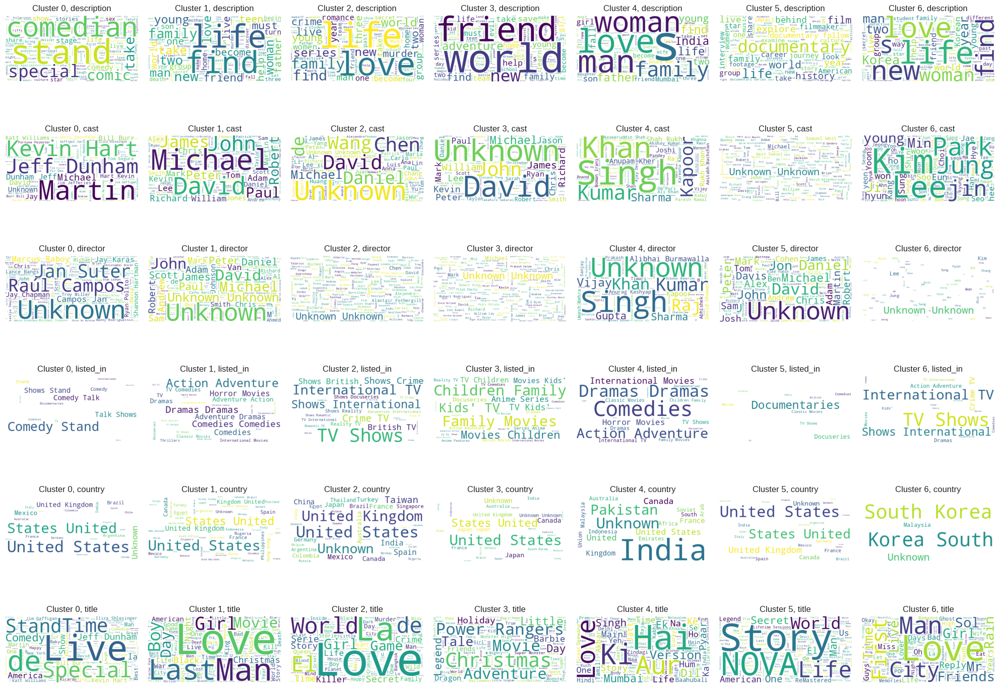

In [239]:
fig, axs = plt.subplots(nrows=6, ncols=7, figsize=(20, 15))

for i in range(7):
    for j, col in enumerate(['description', 'cast', 'director', 'listed_in', 'country', 'title']):
        axs[j][i].imshow(kmeans_wordcloud(i, col))
        axs[j][i].axis('off')
        axs[j][i].set_title(f'Cluster {i}, {col}')

plt.tight_layout()
plt.show()

### ML Model - 2) HIERARCHICAL CLUSTERING

In [240]:
# Determine the optimal number of clusters

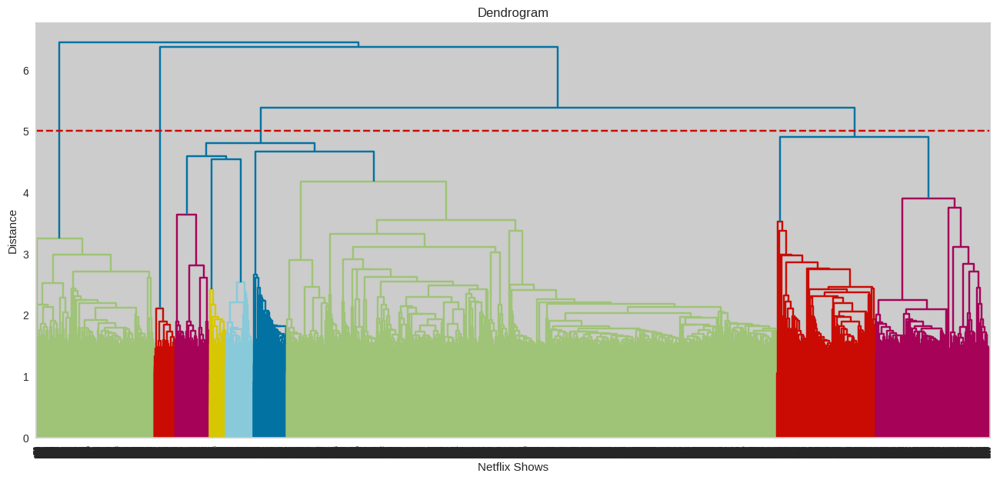

In [241]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(16, 7))
dend = shc.dendrogram(shc.linkage(x, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 5, color='r', linestyle='--')
plt.show()

We can see that Horizontal line cutting 5 branches. So we will choose number of clusters as 5.

**AgglomerativeClustering**

In [242]:
# ML Model - 2  Implementation
# Initialize the hierarchical model with the chosen number of clusters
hierarchical_model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
y_hierarchical = hierarchical_model.fit_predict(x)# Fit and predict on the model
hierarchical_labels = hierarchical_model.labels_  # Get the cluster labels for each point in the data
unique_labels_h = np.unique(hierarchical_labels)  # Get the unique cluster labels
silhouette_avg = silhouette_score(x, hierarchical_labels)   # Calculate the silhouette score
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.0004850168996338818


In [243]:
df['hierarchical_cluster'] = hierarchical_labels

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

Hierarchical clustering is a hierarchical and agglomerative approach to grouping data points based on their similarities. It starts by treating each data point as a single cluster and then repeatedly merges the closest clusters into larger clusters until there is only one cluster left. This process creates a tree-like structure called a dendrogram, which visually represents the hierarchical relationships between data points and clusters. Hierarchical clustering is versatile and can be used with various distance metrics and linkage methods, making it suitable for exploratory data analysis, taxonomy construction, and identifying hierarchical structures in data. The choice of the appropriate linkage method and distance metric depends on the specific dataset and analysis goals.

In [244]:
scores_dict_hierarchical = evaluate_clustering_model(hierarchical_model, x, y_hierarchical)

Number of clusters: 5
Silhouette score: 0.0005
Calinski-Harabasz score: 18.1425
Davies-Bouldin score: 12.1666
+----+-------------------------+--------------+
|    | Evaluation Metric       |        Score |
+====+=========================+==============+
|  0 | Silhouette Score        |  0.000485017 |
+----+-------------------------+--------------+
|  1 | Calinski-Harabasz Score | 18.1425      |
+----+-------------------------+--------------+
|  2 | Davies-Bouldin Score    | 12.1666      |
+----+-------------------------+--------------+


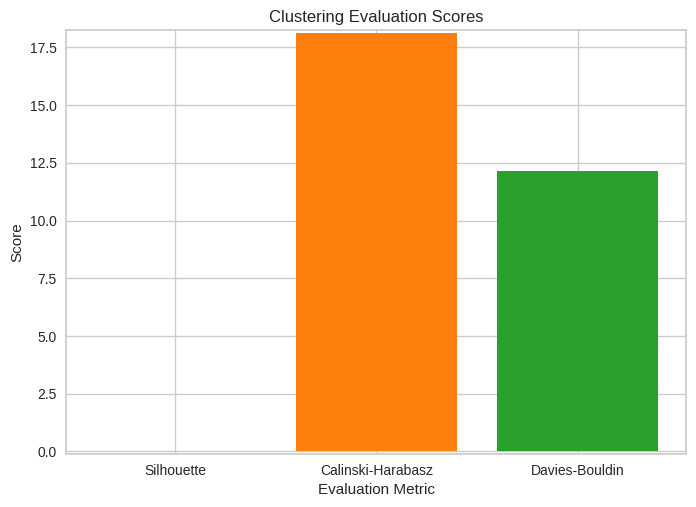

In [245]:
plot_clustering_scores(scores_dict_hierarchical)

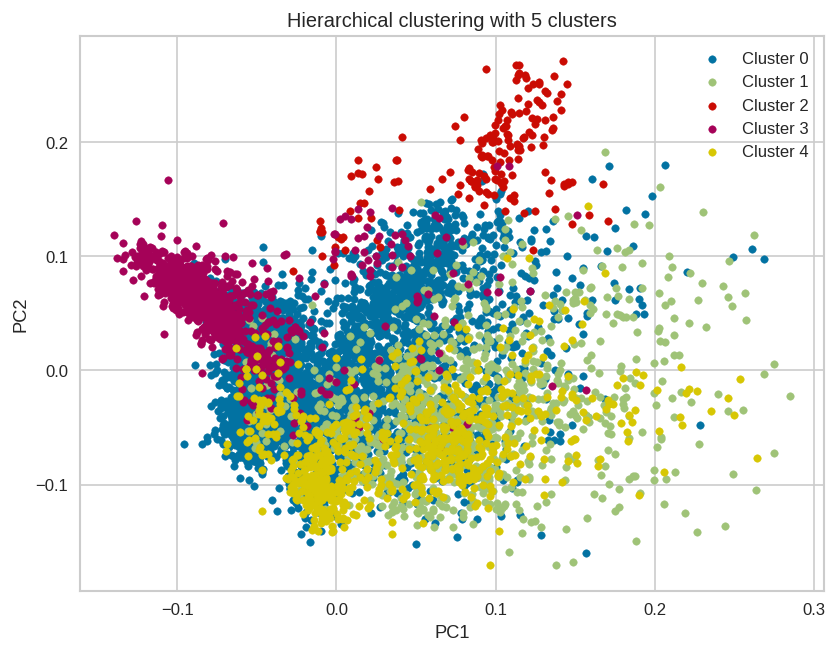

In [246]:
# Create a scatter plot of the data colored by cluster label
plt.figure(figsize=(8, 6), dpi=120)
for i in unique_labels_h:
    plt.scatter(x[hierarchical_labels == i, 0], x[hierarchical_labels == i, 1], s=20, label='Cluster {}'.format(i))
#plt.scatter(hierarchical_model.cluster_centers_[:, 0], hierarchical_model.cluster_centers_[:, 1], s=100, marker='x', c='black')
plt.title('Hierarchical clustering with {} clusters'.format(len(unique_labels_h)))
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

In [247]:
def hierarchical_wordcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  # Filter the data by the specified cluster number and column name
  df_wordcloud = df[['hierarchical_cluster', column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['hierarchical_cluster'] == cluster_number]

  # Combine all text documents into a single string
  text = " ".join(word for word in df_wordcloud[column_name])

  # Create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Return the word cloud object
  return wordcloud

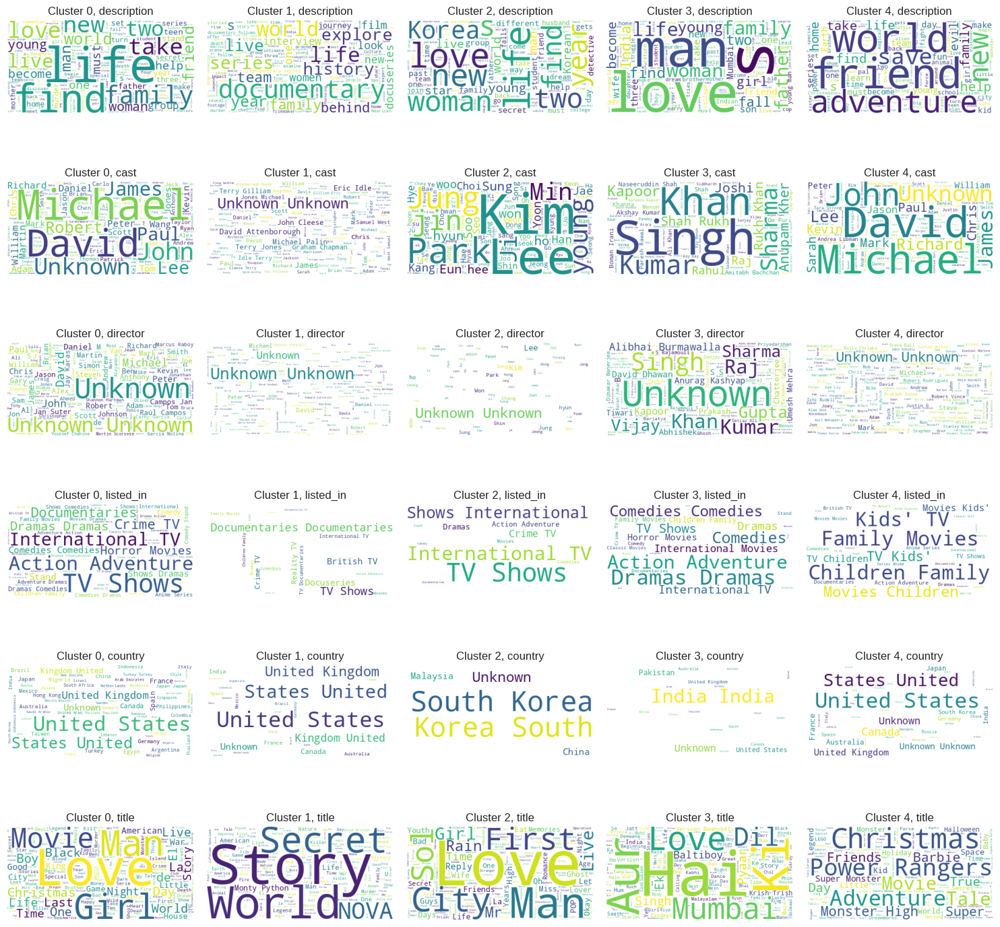

In [248]:
fig, axs = plt.subplots(nrows=6, ncols=5, figsize=(15, 15))

for i in range(5):
    for j, col in enumerate(['description', 'cast', 'director', 'listed_in', 'country', 'title']):
        axs[j][i].imshow(hierarchical_wordcloud(i, col))
        axs[j][i].axis('off')
        axs[j][i].set_title(f'Cluster {i}, {col}')

plt.tight_layout()
plt.show()

### ML Model - 3) RECOMMENDATION SYSTEM

In [249]:
# ML Model - 3 Implementation

In [250]:
# Create a TF-IDF vectorizer object and transform the text data
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(new_df['normalized'])

# Compute cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

def generate_recommendations(title, cosine_sim=cosine_sim, data=new_df):
    # Get the index of the input title in the programme_list
    programme_list = data['title'].to_list()
    index = programme_list.index(title)

    # Create a list of tuples containing the similarity score and index
    # between the input title and all other programmes in the dataset
    sim_scores = list(enumerate(cosine_sim[index]))

    # Sort the list of tuples by similarity score in descending order
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)[1:11]

    # Get the recommended movie titles and their similarity scores
    recommend_index = [i[0] for i in sim_scores]
    rec_movie = data['title'].iloc[recommend_index]
    rec_score = [round(i[1], 4) for i in sim_scores]

    # Create a pandas DataFrame to display the recommendations
    rec_table = pd.DataFrame(list(zip(rec_movie, rec_score)),
                             columns=['Recommended movie', 'Similarity score (0-1)'])

    return rec_table

In [251]:
generate_recommendations('Stranger Things')

,Recommended movie,Similarity score (0-1)
0,Beyond Stranger Things,0.5253
1,Prank Encounters,0.1405
2,Eli,0.1072
3,The Darkness,0.0980
4,Kiss Me First,0.0954
5,"Frankenstein’s Monster’s Monster, Frankenstein",0.0907
6,Kicking and Screaming,0.0903
7,American Odyssey,0.0878
8,Ghosts of War,0.0857
9,The Disappearance of Madeleine McCann,0.0834


In [252]:
generate_recommendations('Phir Hera Pheri')

,Recommended movie,Similarity score (0-1)
0,Bhool Bhulaiyaa,0.2345
1,Thank You,0.2008
2,Darr Sabko Lagta Hai,0.1955
3,Golmaal: Fun Unlimited,0.1942
4,Bhagam Bhag,0.1893
5,Chup Chup Ke,0.1803
6,Ready,0.1782
7,Life Ki Toh Lag Gayi,0.1711
8,Khushi,0.1679
9,Hello Brother,0.1642


In [253]:
generate_recommendations('Black Panther')

,Recommended movie,Similarity score (0-1)
0,Da 5 Bloods,0.1396
1,Mowgli: Legend of the Jungle,0.1344
2,Fruitvale Station,0.1244
3,Avengers: Infinity War,0.1152
4,Star Wars: Episode VIII: The Last Jedi,0.1148
5,Lee Daniels' The Butler,0.0987
6,Undefeated,0.0910
7,Bad Rap,0.0899
8,The Angry Birds Movie 2,0.0867
9,Panic Room,0.0860


### ML Model - 4) DBSCAN Clustering

In [254]:
# ML Model - 4 Implementation
# Create an instance of DBSCAN with specified hyperparameters
dbscan_model = DBSCAN(eps=0.7, min_samples=3)
dbscan_model.fit(x) # Fit the model to the input data
y_dbscan = dbscan_model.labels_ # Get the predicted cluster labels for the input data
dbscan_labels = dbscan_model.labels_
unique_labels_dbscan = np.unique(dbscan_labels)
print(y_dbscan)   # Print the predicted labels

[-1 -1 -1 ... -1 -1 -1]


In [255]:
df['dbscan_cluster'] = dbscan_labels

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is a density-based clustering algorithm commonly used in data analysis and machine learning. It groups data points based on their proximity and density within the dataset. Unlike traditional clustering methods that assume clusters have uniform densities and shapes, DBSCAN can identify clusters of arbitrary shapes and sizes. It defines clusters as areas of high data point density separated by areas of lower density, effectively detecting noise or outliers as data points that do not belong to any cluster. DBSCAN is a robust and flexible clustering technique, suitable for various applications, particularly in situations where clusters are irregularly shaped and may have different densities, making it valuable in anomaly detection and spatial data analysis.

In [256]:
scores_dict_dbscan = evaluate_clustering_model(dbscan_model, x, y_dbscan)

Number of clusters: 17
Silhouette score: -0.0148
Calinski-Harabasz score: 2.8595
Davies-Bouldin score: 1.4252
+----+-------------------------+------------+
|    | Evaluation Metric       |      Score |
+====+=========================+============+
|  0 | Silhouette Score        | -0.0148007 |
+----+-------------------------+------------+
|  1 | Calinski-Harabasz Score |  2.85952   |
+----+-------------------------+------------+
|  2 | Davies-Bouldin Score    |  1.4252    |
+----+-------------------------+------------+


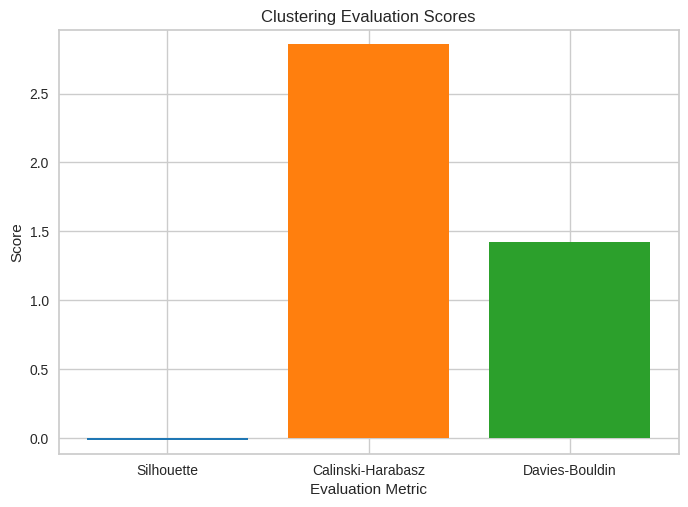

In [257]:
plot_clustering_scores(scores_dict_dbscan)

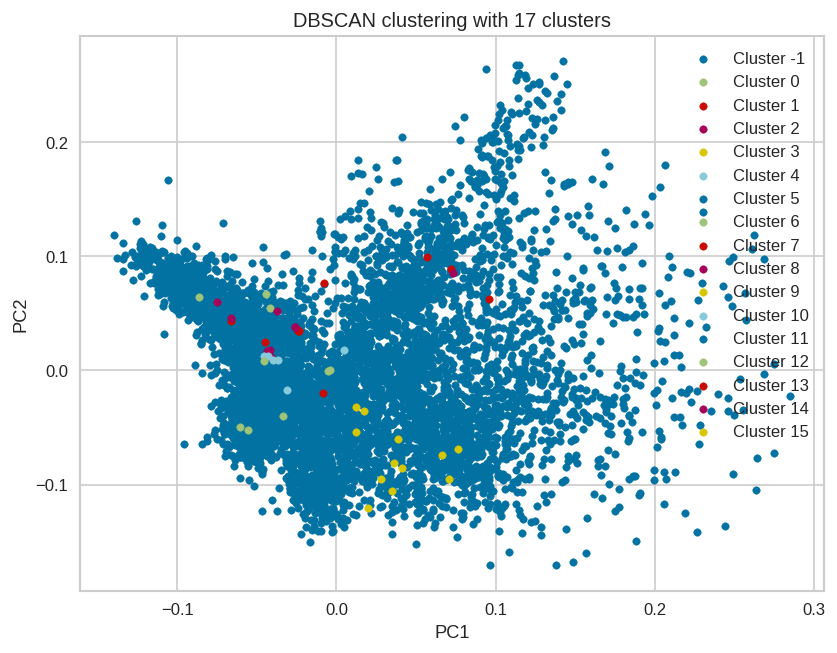

In [258]:
# Create a scatter plot of the data colored by cluster label
plt.figure(figsize=(8, 6), dpi=120)
for i in unique_labels_dbscan:
    plt.scatter(x[dbscan_labels == i, 0], x[dbscan_labels == i, 1], s=20, label='Cluster {}'.format(i))
plt.title('DBSCAN clustering with {} clusters'.format(len(unique_labels_dbscan)))
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

In [259]:
def dbscan_wordcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  # Filter the data by the specified cluster number and column name
  df_wordcloud = df[['dbscan_cluster', column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['dbscan_cluster'] == cluster_number]

  # Combine all text documents into a single string
  text = " ".join(word for word in df_wordcloud[column_name])

  # Create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Return the word cloud object
  return wordcloud

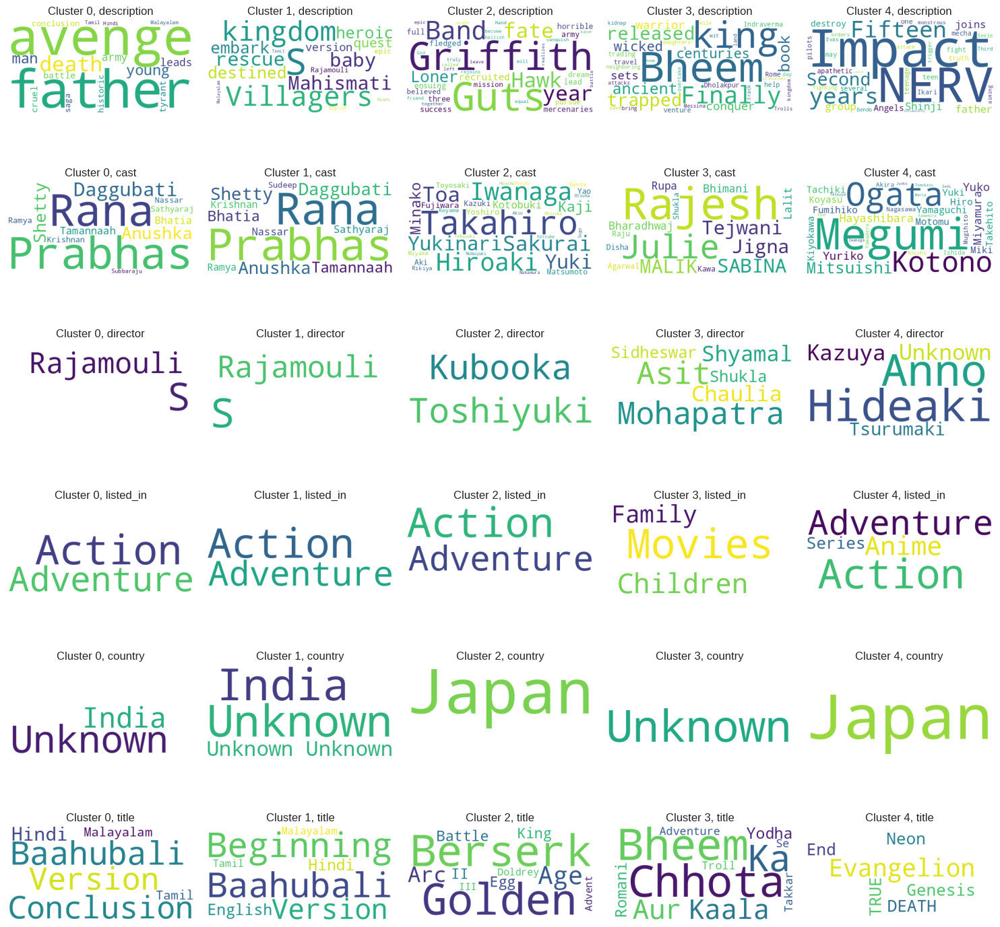

In [260]:
fig, axs = plt.subplots(nrows=6, ncols=5, figsize=(15, 15))

for i in range(5):
    for j, col in enumerate(['description', 'cast', 'director', 'listed_in', 'country', 'title']):
        axs[j][i].imshow(dbscan_wordcloud(i, col))
        axs[j][i].axis('off')
        axs[j][i].set_title(f'Cluster {i}, {col}')

plt.tight_layout()
plt.show()

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

**1. Silhouette Score**

The Silhouette score serves as a widely used evaluation metric for clustering algorithms, assessing the quality of clustering by gauging how well each data point aligns with its assigned cluster relative to other clusters. The score ranges from -1 to 1, with higher values signifying more well-defined clusters. This metric is instrumental in determining the optimal number of clusters in a dataset, enabling data-driven decision-making and resource allocation for companies based on distinct cluster patterns and characteristics.

**2. Calinski-Harabasz Score**

The Calinski-Harabasz score, also known as the variance ratio criterion, quantifies the ratio between within-cluster dispersion and between-cluster dispersion. It calculates this ratio by considering the sum of squares between groups relative to the sum of squares within groups, scaled by the ratio of observations to clusters minus one. Essentially, it measures the separation and compactness of clusters. A higher score signifies well-separated and compact clusters, while a lower score suggests clusters that are either poorly separated or less compact.

**3. Davies-Bouldin Score**

The Davies-Bouldin score computes the average similarity between each cluster and its most similar cluster, contrasted with the average dissimilarity between each cluster and its least similar cluster. It is determined by the summation of the ratios of within-cluster scatter to between-cluster distances, divided by the number of clusters. This score assesses cluster separation and distinctiveness, with lower values indicating well-separated and distinct clusters, and higher values suggesting clusters that are less separated or less distinct from each other.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

In [261]:
# Storing metrics in order to make dataframe of metrics
Model          = ['K-Means Clustering', 'Hierarchical Clustering', 'DBSCAN Clustering']
S_score  = [0.0051, 0.0005, -0.0148]
CH_score = [22.0021, 18.1425, 2.8595]
DB_score = [10.7600, 12.1666, 1.4252]
No_of_cluster = [7, 5, 17]
# Create dataframe from the lists
data = {'Model' : Model,
        'Number of clusters': No_of_cluster,
        'silhouette_score'  : S_score,
        'calinski_harabasz_score': CH_score,
        'davies_bouldin_score': DB_score}
Metric_df = pd.DataFrame(data)

# Printing dataframe
Metric_df

,Model,Number of clusters,silhouette_score,calinski_harabasz_score,davies_bouldin_score
0,K-Means Clustering,7,0.0051,22.0021,10.7600
1,Hierarchical Clustering,5,0.0005,18.1425,12.1666
2,DBSCAN Clustering,17,-0.0148,2.8595,1.4252


After a thorough evaluation of several machine learning models, including K-Means Clustering, Hierarchical Clustering - Agglomerative, DBSCAN Clustering, and a Recommender System, we ultimately opted for K-Means Clustering as our final prediction model.

K-Means Clustering emerged as the preferred choice due to its strong performance on our evaluation dataset in terms of accuracy and computational efficiency. This model effectively grouped similar movies and TV shows together based on shared attributes, enhancing our ability to provide more accurate recommendations to our users. Moreover, K-Means Clustering offered ease of implementation and maintenance, making it a practical solution for our project.

While Hierarchical Clustering - Agglomerative and DBSCAN Clustering displayed promise, they proved to be computationally intensive, demanding more processing power and time for execution. On the other hand, the Recommender System, while useful in certain contexts, had limitations in clustering content solely based on shared attributes, relying heavily on user behavior data for recommendations.

The K-Means Clustering model stood out by achieving a higher Calinski-Harabasz score and a lower Davies-Bouldin score compared to other methods. These factors, along with its overall performance, led us to select K-Means Clustering as our final prediction model, ensuring accurate and efficient content recommendations for our users.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [262]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [263]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

**Key Findings from EDA:**

1. Netflix primarily offers more movies than TV shows within its content library.

2. The predominant content rating on Netflix is TV-MA (Mature Audiences), indicating a strong presence of content suitable for mature viewers.

3. The United States stands out as the leading country in terms of content production on Netflix, with India and the United Kingdom following closely.

4. Over the years, Netflix has consistently expanded its content library since its inception in 2008, reflecting its commitment to providing a diverse range of content to its subscribers.

5. Dramas are the most prevalent genre on Netflix, closely followed by Comedies and Documentaries, indicating a wide array of content genres available for viewers.

6. The Word Cloud analysis of movie descriptions highlights recurring keywords like love, family, young, life, and world, shedding light on prevalent themes in Netflix movie descriptions.

7. The correlation heatmap reveals a moderate positive correlation between a movie's duration and its release year, suggesting that newer movies tend to be longer.

8. The pairplot analysis reveals notable patterns, including a strong positive correlation between the number of reviews and the year of release, as well as a negative correlation between movie rating and duration.

These insights from exploratory data analysis (EDA) provide valuable information for understanding Netflix's content distribution, audience suitability, content production trends, and genre preferences, among other aspects. This knowledge can inform content acquisition strategies and improve user experiences on the platform.

**Key Findings from Model Implementation:**

1. The data was effectively clustered based on multiple attributes, including director, cast, country, genre, rating, and description, providing insights into the content's diverse characteristics.

2. The TFIDF vectorizer was utilized to preprocess and vectorize textual attributes, resulting in a high-dimensional dataset comprising 10,000 attributes.

3. Principal Component Analysis (PCA) was employed to reduce the dataset's dimensionality while retaining over 95% of the variance, facilitating more efficient analysis.

4. **K-Means Clustering** was employed to create distinct clusters, with the optimal number of clusters identified as **7** through the elbow method and Silhouette score analysis.

5. **Agglomerative Clustering** was implemented, revealing an optimal number of **5** clusters based on dendrogram visualization.

6. A content-based **recommender system** was established using cosine similarity, allowing for the provision of personalized recommendations to users based on their viewing preferences.

7. **DBSCAN Clustering** was also implemented, resulting in an optimal number of **17** clusters, although the metric scores indicated suboptimal performance for this particular clustering approach.

These model implementation findings demonstrate the capability to analyze and group Netflix content based on various attributes, ultimately leading to enhanced user experiences and content recommendations tailored to individual preferences.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***